**Prepare workspace**

In [2]:
getwd()

[1] "/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq"

**Load libraries**

In [873]:
options(stringsAsFactors=FALSE)

library(Seurat)
library(dplyr)
library(Matrix)
library(SCopeLoomR)
library(IRdisplay)
library(plyr)
library(patchwork)

### Load the raw data (expression matrix)

In [4]:
# Check the content of the path: 
dir('/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/CellRanger_out/')

[1] "barcodes.tsv" "genes.tsv"    "matrix.mtx"

In [5]:
# Read the file and format as expression matrix
expression_matrix <- Read10X(
  data.dir='/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/CellRanger_out/',
  unique.features = TRUE,
  strip.suffix = FALSE
)
dim(expression_matrix)

[1] 41625  9000

In [6]:
#inspect the top left corner of the expression matrix
expression_matrix[1:50,1:2]

50 x 2 sparse Matrix of class "dgCMatrix"
              pPDCN4340DAPIA030419_AAGTACCCATTGGCAT-1
RP11-34P13.3                                        .
FAM138A                                             .
OR4F5                                               .
RP11-34P13.7                                        .
RP11-34P13.8                                        .
RP11-34P13.14                                       .
RP11-34P13.9                                        .
FO538757.3                                          .
FO538757.2                                          3
AP006222.2                                          .
RP5-857K21.15                                       .
RP4-669L17.2                                        .
RP4-669L17.10                                       .
OR4F29                                              .
RP5-857K21.4                                        9
RP5-857K21.2                                        .
OR4F16                                  

### Create a Seurat object

In [703]:
seurat_object = CreateSeuratObject(counts = expression_matrix, min.cells = 20, min.features = 200)
seurat_object # Shows a summary of the object

An object of class Seurat 
26285 features across 9000 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

#### Add meta data

In [704]:
cellMetadata <- read.delim('/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/data/metadata.tsv.gz')
head(cellMetadata)

,NAME,libname,biosample_id,donor_id,species,species__ontology_label,disease,disease__ontology_label,organ,organ__ontology_label,library_preparation_protocol,library_preparation_protocol__ontology_label,sex,date,Donor_Age,Donor_PMI,Status,Cause_of_Death,FACS_Classification
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,TYPE,group,group,group,group,group,group,group,group,group,group,group,group,group,numeric,numeric,group,group,group
2,pPDCN4340DAPIA030419_AATGCCACACAAGCAG-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
3,pPDCN4340DAPIA030419_AGACTCAGTCACAATC-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
4,pPDCN4340DAPIA030419_ATACTTCCAGCGTTGC-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
5,pPDCN4340DAPIA030419_ATATCCTGTGTGTTTG-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
6,pPDCN4340DAPIA030419_ATCCACCGTGGGTTGA-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative


In [705]:
dim(cellMetadata)

[1] 437430     19

In [706]:
head(cellMetadata)

,NAME,libname,biosample_id,donor_id,species,species__ontology_label,disease,disease__ontology_label,organ,organ__ontology_label,library_preparation_protocol,library_preparation_protocol__ontology_label,sex,date,Donor_Age,Donor_PMI,Status,Cause_of_Death,FACS_Classification
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,TYPE,group,group,group,group,group,group,group,group,group,group,group,group,group,numeric,numeric,group,group,group
2,pPDCN4340DAPIA030419_AATGCCACACAAGCAG-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
3,pPDCN4340DAPIA030419_AGACTCAGTCACAATC-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
4,pPDCN4340DAPIA030419_ATACTTCCAGCGTTGC-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
5,pPDCN4340DAPIA030419_ATATCCTGTGTGTTTG-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative
6,pPDCN4340DAPIA030419_ATCCACCGTGGGTTGA-1,pPDCN4340DAPIA030419,pPDCN4340DAPIA030419,4340,NCBITaxon_9606,Homo sapiens,PATO_0000461,normal,UBERON_0001873,caudate nucleus,EFO_0009901,10x 3' v1,male,190304,47,12.5,Ctrl,Esophageal cancer with liver mets,Negative


In [707]:
# select metadata for Homo Sapiens only
cellMetadata <- filter(cellMetadata, species__ontology_label == "Homo sapiens")

# Use cells as row names (easier subset)
rownames(cellMetadata) <- cellMetadata$NAME

# Select relevant annotations
cellMetadata <- cellMetadata[,c('biosample_id', 'donor_id', 'disease__ontology_label', 'organ__ontology_label', 'sex', 'Donor_Age', 'Status', 'Cause_of_Death', 'FACS_Classification')]

# Select cells in the seurat object
cellMetadata <- cellMetadata[Cells(seurat_object),]
dim(cellMetadata)

[1] 9000    9

In [708]:
# Select cells in the seurat object
cellMetadata <- cellMetadata[Cells(seurat_object),]
dim(cellMetadata)

[1] 9000    9

In [709]:
head(cellMetadata)

,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
pPDCN4340DAPIA030419_AAGTACCCATTGGCAT-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_ACGGGTCCATACCATG-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CAGGCCACATCGTTCC-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CTCCATGTCTTAGGAC-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_CTGTCGTCAGAGGAAA-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative
pPDCN4340DAPIA030419_GCAACATGTCTTCTAT-1,pPDCN4340DAPIA030419,4340,normal,caudate nucleus,male,47,Ctrl,Esophageal cancer with liver mets,Negative


In [710]:
table(cellMetadata$disease__ontology_label)


Lewy body dementia             normal  Parkinson disease 
              1351               4854               2795 

In [711]:
table(cellMetadata$organ__ontology_label)


               caudate nucleus substantia nigra pars compacta 
                           979                           8021 

In [712]:
table(cellMetadata$sex)


female   male 
  5343   3657 

In [713]:
table(cellMetadata$Donor_Age)


  25   47   49   59   70   74   75   76   78   79   82   83   89   90   91   92 
 174  450  403  306  233  238  503  618  463  822 1345  750  377 1279  526  513 

In [714]:
table(cellMetadata$Status)


Ctrl  LBD   PD 
4854 1351 2795 

In [715]:
sort(table(cellMetadata$Cause_of_Death), T)


                      Parkinson's disease 
                                     3298 
                             Colon cancer 
                                     1660 
                       Lewy body dementia 
                                      848 
                          Prostate cancer 
                                      807 
                  Coronary artery disease 
                                      528 
                 Congestive Heart failure 
                                      526 
        Esophageal cancer with liver mets 
                                      450 
         Colon cancer, cholangiocarcinoma 
                                      306 
                               Not listed 
                                      265 
Seizure disorder,congenital heart disease 
                                      174 
                         Smoke inhalation 
                                      138 

In [716]:
table(cellMetadata$FACS_Classification)


Negative     NeuN Positive 
    5779      134     3087 

In [717]:
seurat_object <- AddMetaData(seurat_object, metadata = cellMetadata)

In [718]:
# Subset cells for substantia nigra pars compacta
seurat_object <- subset(seurat_object, subset = organ__ontology_label == "substantia nigra pars compacta")

In [719]:
head(seurat_object[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB,21056,6877,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive
pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB,11135,4520,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive
pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB,15028,5685,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive
pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB,13359,5260,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive
pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1,pPDsHSrSNxi3482d200429PosB,11875,5224,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive
pPDsHSrSNxi3482d200429PosB_TTCATTGCAGTGGCTC-1,pPDsHSrSNxi3482d200429PosB,10019,4346,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive


In [720]:
all(seurat_object[['orig.ident']] == seurat_object[['biosample_id']])

[1] TRUE

In [721]:
# Number of cells by batch:
cbind(sort(table(seurat_object[['orig.ident']])))

pPDCN3839DAPIA030419,0
pPDCN3839DAPIB030419,0
pPDCN3898DAPIA030419,0
pPDCN3898DAPIB030419,0
pPDCN4340DAPIA030419,0
pPDCN4340DAPIB030419,0
pPDCN5730DAPI22119,0
pPDCN5730NeuN22119,0
pPDsHSrSNxi3298d200429PosB,1
pPDsHSrSNxi2142d200429PosA,2
pPDsHSrSNxi1963d200429PosC,3


In [722]:
# save a ready to use seurat object
save(seurat_object, file='seurat_object_parkinson_nigra.RData')

### Quality control & Filtering


In [723]:
unique(seurat_object@meta.data$donor_id)

[1] "3482" "3346" "3873" "5610" "3322" "3345" "4956" "6173" "4775" "2544"
[11] "3887" "4560" "2561" "4568" "2142" "1963" "2569" "3298"

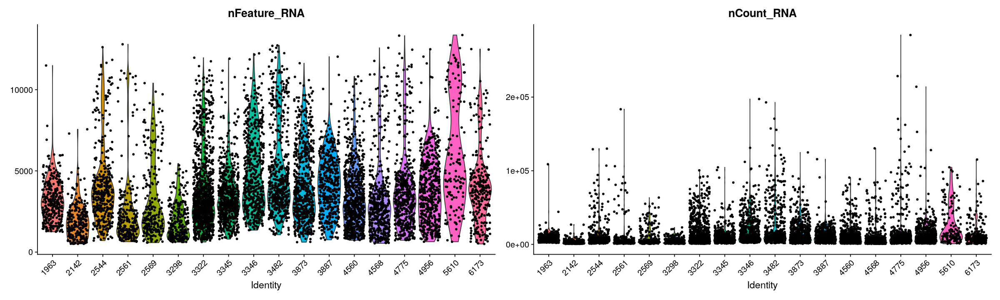

In [724]:
options(repr.plot.width=20, repr.plot.height=6) # To set the figure size
VlnPlot(object = seurat_object, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2, group.by='donor_id')

In [725]:
seurat_object[['AllData']] <- 'AllData'

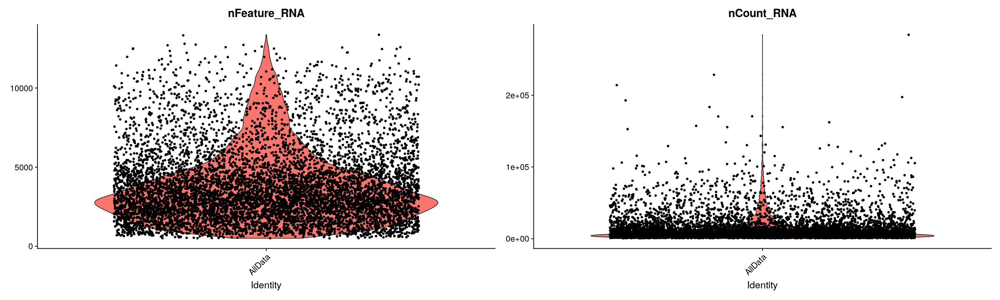

In [726]:
options(repr.plot.width=20, repr.plot.height=6) # To set the figure size
VlnPlot(object = seurat_object, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2, group.by='AllData')

In [727]:
# View values
summary(seurat_object@meta.data$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    502    2124    3225    3787    4776   13366 

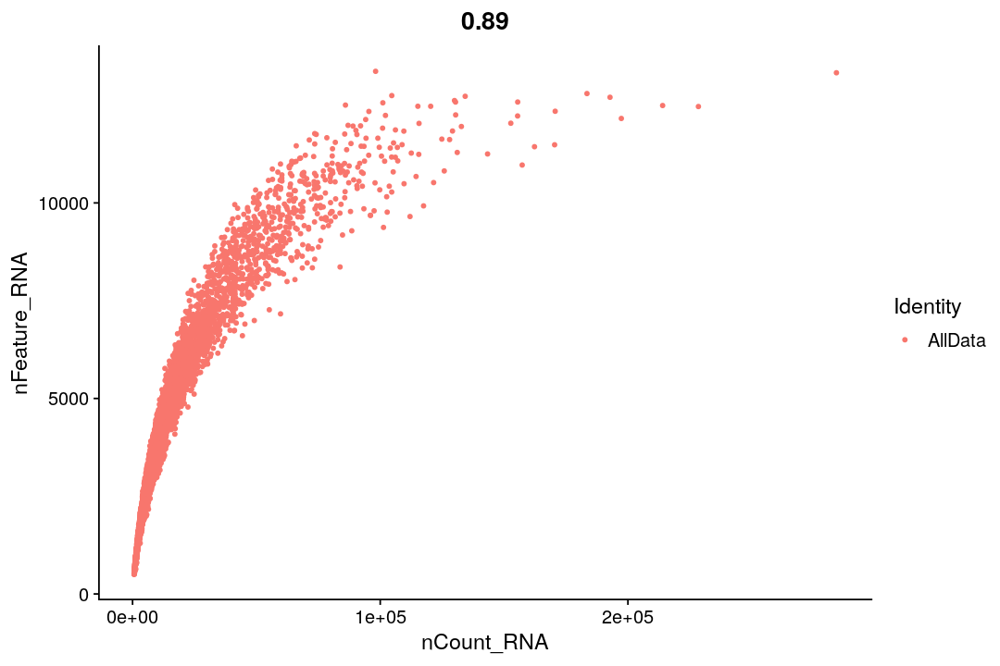

In [728]:
options(repr.plot.width=9, repr.plot.height=6)
FeatureScatter(object = seurat_object, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by='AllData')

In [729]:
# Check number of cells that pass the filter:
subset(seurat_object, subset = nFeature_RNA >= 1000 & nCount_RNA <= 25000)

An object of class Seurat 
26285 features across 6563 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

In [730]:
seurat_object

An object of class Seurat 
26285 features across 8021 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

In [731]:
# Perform the filtering (i.e. store the returned object)
seurat_object <- subset(seurat_object, subset = nFeature_RNA >= 1000 & nCount_RNA <= 25000)

In [732]:
seurat_object

An object of class Seurat 
26285 features across 6563 samples within 1 assay 
Active assay: RNA (26285 features, 0 variable features)

Let's see the new distributions:

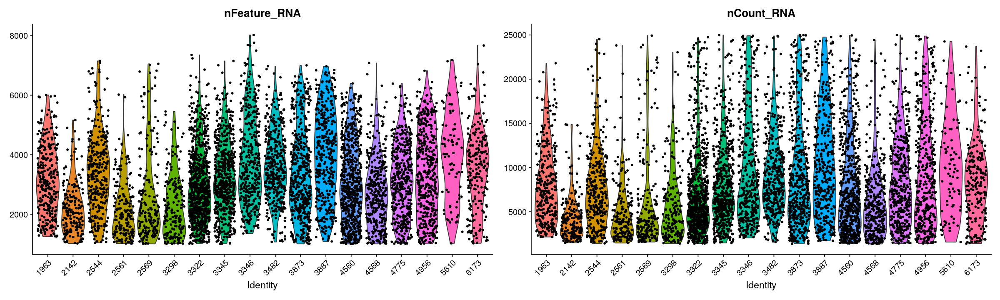

In [733]:
options(repr.plot.width=20, repr.plot.height=6)
VlnPlot(object = seurat_object, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2, group.by='donor_id')

#### Filtering based on mitochondrial genes

In [734]:
seurat_object[["percent.mt"]] <- PercentageFeatureSet(seurat_object, pattern = "^MT-")

In [735]:
summary(seurat_object[["percent.mt"]])

   percent.mt      
 Min.   : 0.04747  
 1st Qu.: 0.54958  
 Median : 1.14320  
 Mean   : 2.12137  
 3rd Qu.: 2.77440  
 Max.   :10.00151  

In [736]:
head(seurat_object[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification,AllData,percent.mt
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB,21056,6877,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.0089286
pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB,11135,4520,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,0.7992815
pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB,15028,5685,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,6.8472185
pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB,13359,5260,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,1.5270604
pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1,pPDsHSrSNxi3482d200429PosB,11875,5224,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.8463158
pPDsHSrSNxi3482d200429PosB_TTCATTGCAGTGGCTC-1,pPDsHSrSNxi3482d200429PosB,10019,4346,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.2457331


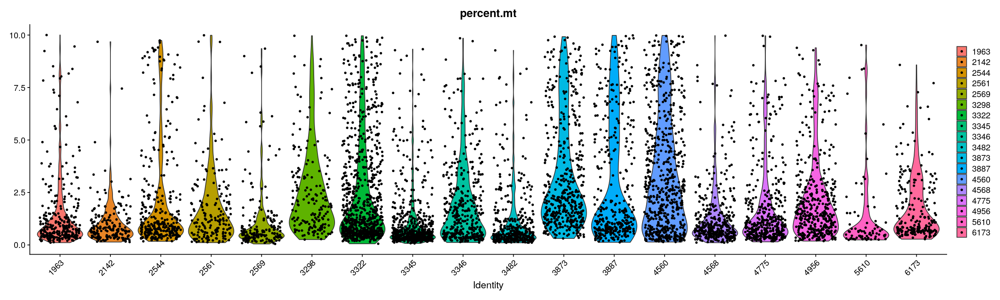

In [737]:
options(repr.plot.width=20, repr.plot.height=6)
VlnPlot(seurat_object, features = c("percent.mt"), group.by='donor_id')

### Normalizing the data 


In [738]:
seurat_object <- NormalizeData(seurat_object)

In [739]:
# seurat_object[["RNA"]]@data[1:5,1:5]
GetAssayData(seurat_object, slot="data")[1:5,1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
              pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1
RP11-34P13.7                                      .        
FO538757.2                                        .        
AP006222.2                                        .        
RP4-669L17.10                                     .        
RP5-857K21.4                                      0.6677514
              pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1
RP11-34P13.7                                              .
FO538757.2                                                .
AP006222.2                                                .
RP4-669L17.10                                             .
RP5-857K21.4                                              .
              pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1
RP11-34P13.7                                       .       
FO538757.2                                         .       
AP006222.2                                         .       

In [740]:
# parkinson_seurat_obj[["RNA"]]@counts
GetAssayData(seurat_object, slot="counts")[1:5,1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
              pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1
RP11-34P13.7                                              .
FO538757.2                                                .
AP006222.2                                                .
RP4-669L17.10                                             .
RP5-857K21.4                                              2
              pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1
RP11-34P13.7                                              .
FO538757.2                                                .
AP006222.2                                                .
RP4-669L17.10                                             .
RP5-857K21.4                                              .
              pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1
RP11-34P13.7                                              .
FO538757.2                                                .
AP006222.2                                                .

### Find variable genes


In [741]:
seurat_object <- FindVariableFeatures(seurat_object)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”


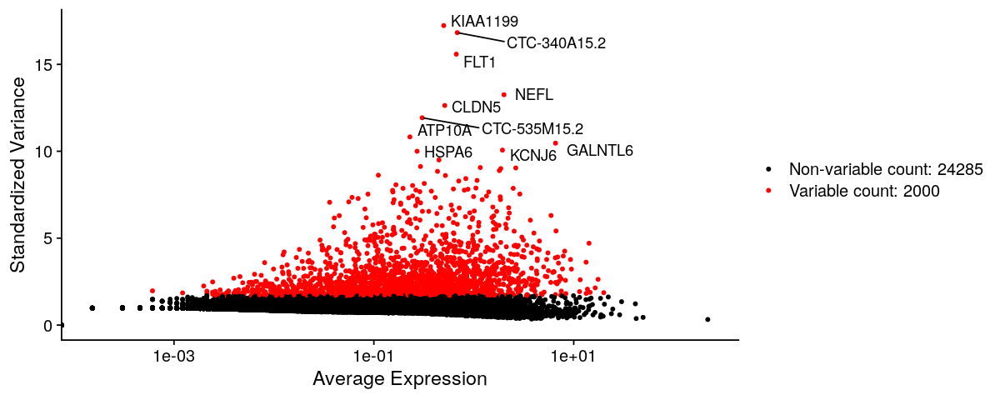

In [742]:
# plot variable features
options(repr.plot.width=10, repr.plot.height=4)
plot1 <- VariableFeaturePlot(seurat_object)
LabelPoints(plot=plot1, points=VariableFeatures(seurat_object)[1:10], repel = TRUE)

### Scaling the data


In [743]:
allGenes <- rownames(seurat_object)
seurat_object <- ScaleData(seurat_object, features = allGenes)

Centering and scaling data matrix



In [744]:
# seurat_object[["RNA"]]@scale.data[1:5,1:5]
GetAssayData(seurat_object, slot="scale.data")[1:5,1:5]

,pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1
RP11-34P13.7,-0.09462082,-0.09462082,-0.09462082,-0.09462082,-0.09462082
FO538757.2,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
AP006222.2,-0.14516255,-0.14516255,-0.14516255,-0.14516255,-0.14516255
RP4-669L17.10,-0.02540526,-0.02540526,-0.02540526,-0.02540526,-0.02540526
RP5-857K21.4,1.50381466,-0.36110513,3.73012721,-0.36110513,-0.36110513


### Dimensionality reduction (PCA)

In [745]:
seurat_object <- RunPCA(seurat_object, ndims.print = 1:3, nfeatures.print = 5)

PC_ 1 
Positive:  SPP1, FTL, CRYAB, SEPP1, PCSK6 
Negative:  RIMS2, FAM155A, MYT1L, FGF12, MEG3 
PC_ 2 
Positive:  ATP1A2, HPSE2, LINC01088, RNF219-AS1, GJA1 
Negative:  ATP1B1, CNTNAP2, NRXN3, PCSK6, SPP1 
PC_ 3 
Positive:  DOCK8, SLCO2B1, ADAM28, MEF2C, APBB1IP 
Negative:  PCSK6, LINC00609, ERMN, CRYAB, SEPP1 



In [746]:
print(seurat_object[["pca"]], dims = 1:4, nfeatures = 20)

PC_ 1 
Positive:  SPP1, FTL, CRYAB, SEPP1, PCSK6, SLC1A3, ERMN, LINC00609, SCD, PPP1R14A 
	   PADI2, RP11-946L20.2, B2M, S100B, APOD, CDKN1C, MARCKSL1, HSPA1A, AC012593.1, RP4-630C24.3 
Negative:  RIMS2, FAM155A, MYT1L, FGF12, MEG3, MEG8, FGF14, ATP8A2, CADPS, ROBO2 
	   PTPRN2, SYT1, SNHG14, PAK3, CCSER1, AGBL4, LRFN5, CDH18, STXBP5L, CACNA1B 
PC_ 2 
Positive:  ATP1A2, HPSE2, LINC01088, RNF219-AS1, GJA1, RFX4, AQP4, SPARCL1, HIF3A, PITPNC1 
	   SLC14A1, SLC4A4, PAMR1, EFEMP1, PARD3, LHFP, MAPK4, RP11-627D16.1, BMPR1B, FAM189A2 
Negative:  ATP1B1, CNTNAP2, NRXN3, PCSK6, SPP1, ERMN, ROBO1, CDH8, RP11-946L20.2, PDE1A 
	   IQCJ-SCHIP1, LINC00609, SCD, RYR2, RP4-630C24.3, SEZ6L2, STMN4, ADARB2, SEPP1, ERC2 
PC_ 3 
Positive:  DOCK8, SLCO2B1, ADAM28, MEF2C, APBB1IP, PTPRC, FYB, ARHGAP15, INPP5D, TBXAS1 
	   SYK, PALD1, DENND3, FLI1, ARHGAP24, CSF1R, ATP8B4, CD74, ST6GAL1, LYN 
Negative:  PCSK6, LINC00609, ERMN, CRYAB, SEPP1, SCD, RP11-946L20.2, AC012593.1, S100B, RP4-630C24.3 
	   MARCKSL1, 

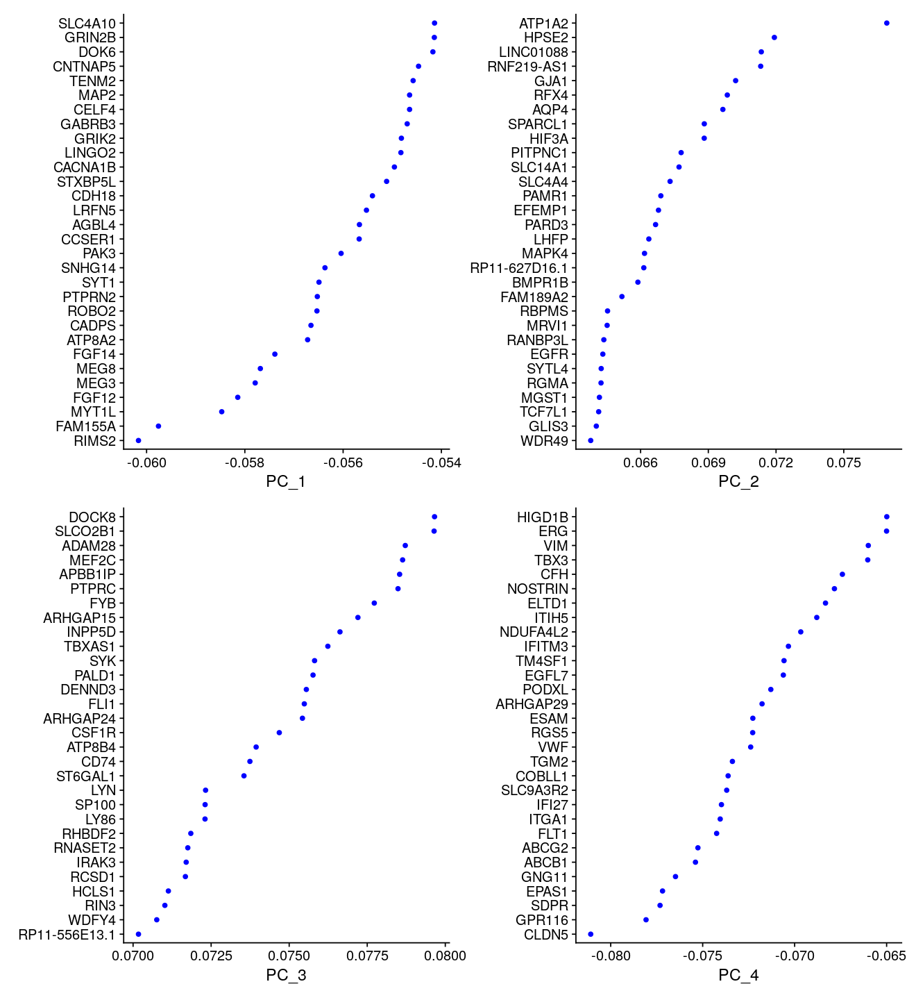

In [747]:
options(repr.plot.width=11, repr.plot.height=12)
VizDimLoadings(seurat_object, dims = 1:4, reduction = "pca")

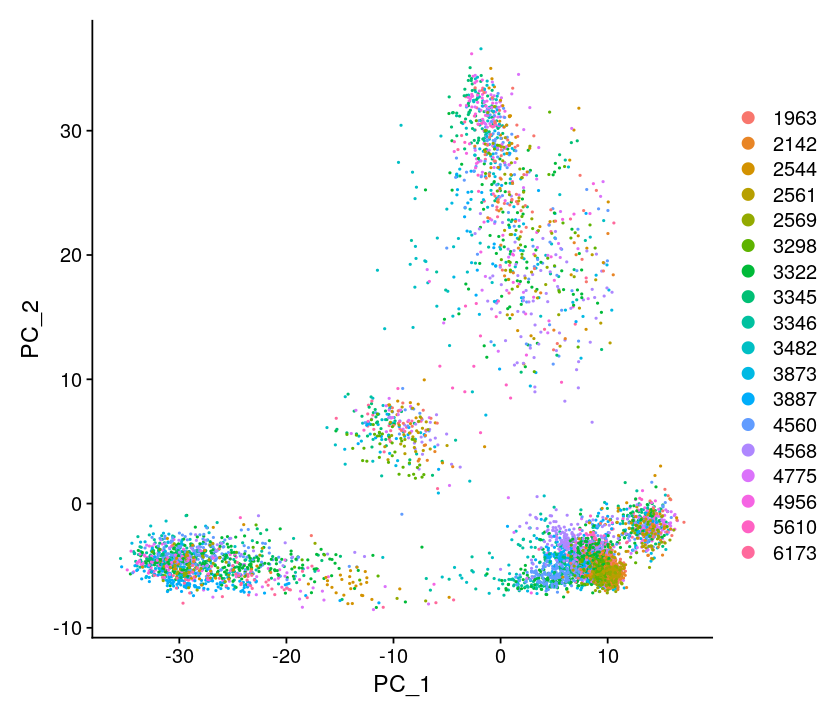

In [748]:
options(repr.plot.width=7, repr.plot.height=6)
DimPlot(seurat_object, reduction = "pca", group.by = "donor_id")

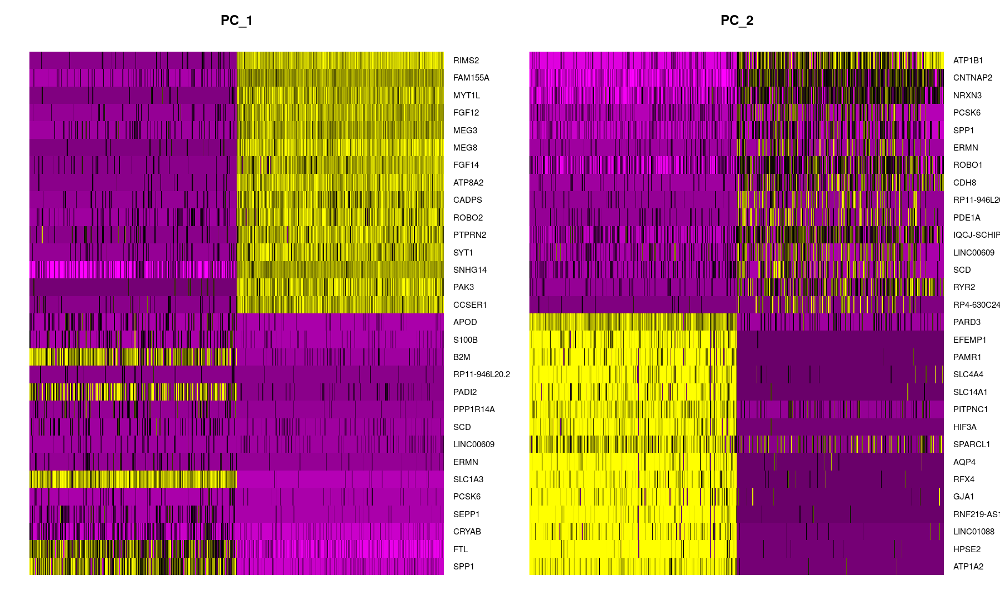

In [749]:
options(repr.plot.width=15, repr.plot.height=9)
DimHeatmap(seurat_object, dims = 1:2, cells = 500, balanced = TRUE)

### Clustering the cells

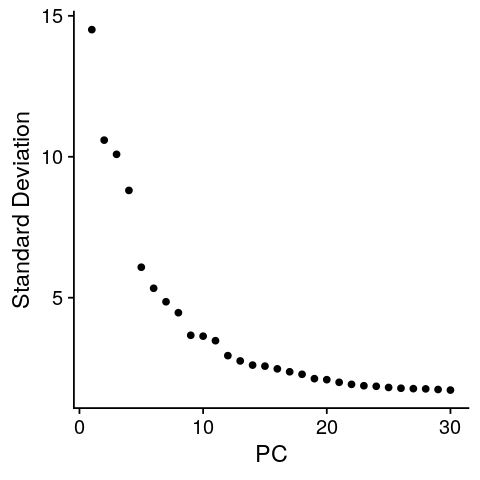

In [750]:
options(repr.plot.width=4, repr.plot.height=4)
ElbowPlot(seurat_object, ndims=30)

In [751]:
seurat_object <- FindNeighbors(seurat_object, dims = 1:12)
seurat_object <- FindClusters(seurat_object, resolution = c(0.01, 0.05, 0.075, 0.1, 0.5))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6563
Number of edges: 213229

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9969
Number of communities: 7
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6563
Number of edges: 213229

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9856
Number of communities: 8
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6563
Number of edges: 213229

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9793
Number of communities: 10
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6563
Number of edges: 213229

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9743
Number of communities: 11
Elapsed time: 0 seconds
Modularity Optimiz

In [752]:
head(seurat_object[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification,AllData,percent.mt,RNA_snn_res.0.01,RNA_snn_res.0.05,RNA_snn_res.0.075,RNA_snn_res.0.1,RNA_snn_res.0.5,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB,21056,6877,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.0089286,3,3,3,3,3,3
pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB,11135,4520,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,0.7992815,3,3,3,3,3,3
pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB,15028,5685,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,6.8472185,4,4,5,6,8,8
pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB,13359,5260,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,1.5270604,4,4,9,10,13,13
pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1,pPDsHSrSNxi3482d200429PosB,11875,5224,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.8463158,4,4,5,6,8,8
pPDsHSrSNxi3482d200429PosB_TTCATTGCAGTGGCTC-1,pPDsHSrSNxi3482d200429PosB,10019,4346,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.2457331,4,4,5,6,8,8


In [753]:
# How many clusters are there in each resolution?
for (x in c('RNA_snn_res.0.01', 'RNA_snn_res.0.05', 'RNA_snn_res.0.075', 'RNA_snn_res.0.1', 'RNA_snn_res.0.5'))
{
    message(x, ': ', length(unique(unlist(seurat_object[[x]]))), ' clusters')
}
    

RNA_snn_res.0.01: 7 clusters

RNA_snn_res.0.05: 8 clusters

RNA_snn_res.0.075: 10 clusters

RNA_snn_res.0.1: 11 clusters

RNA_snn_res.0.5: 15 clusters



In [754]:
# How many cells are assigned by cluster?
table(Idents(seurat_object))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14 
1347 1282  673  639  612  382  299  266  251  237  202  174   93   58   48 

### 2D projections 

In [755]:
# tSNE
seurat_object <- RunTSNE(seurat_object, dims = 1:12)
# UMAP
seurat_object <- RunUMAP(seurat_object, dims = 1:12)

05:24:57 UMAP embedding parameters a = 0.9922 b = 1.112

05:24:57 Read 6563 rows and found 12 numeric columns

05:24:57 Using Annoy for neighbor search, n_neighbors = 30

05:24:57 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

05:24:58 Writing NN index file to temp file /tmp/Rtmpzy6c8E/file26e8d77c03fc4c

05:24:58 Searching Annoy index using 1 thread, search_k = 3000

05:25:00 Annoy recall = 100%

05:25:01 Commencing smooth kNN distance calibration using 1 thread

05:25:03 Found 3 connected components, falling back to 'spca' initialization with init_sdev = 1

05:25:03 Initializing from PCA

05:25:03 PCA: 2 components explained 49.01% variance

05:25:03 Commencing optimization for 500 epochs, with 272400 positive edges

05:25:11 Optimization finished



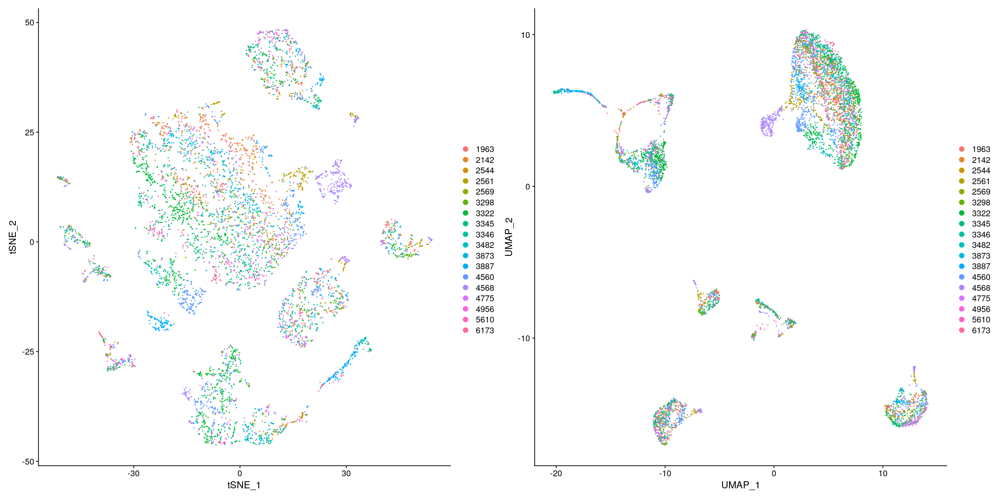

In [756]:
options(repr.plot.width=20, repr.plot.height=10)
plot1 <- DimPlot(seurat_object, reduction = "tsne", group.by = "donor_id")
plot2 <- DimPlot(seurat_object, reduction = "umap", group.by = "donor_id")
plot1 + plot2

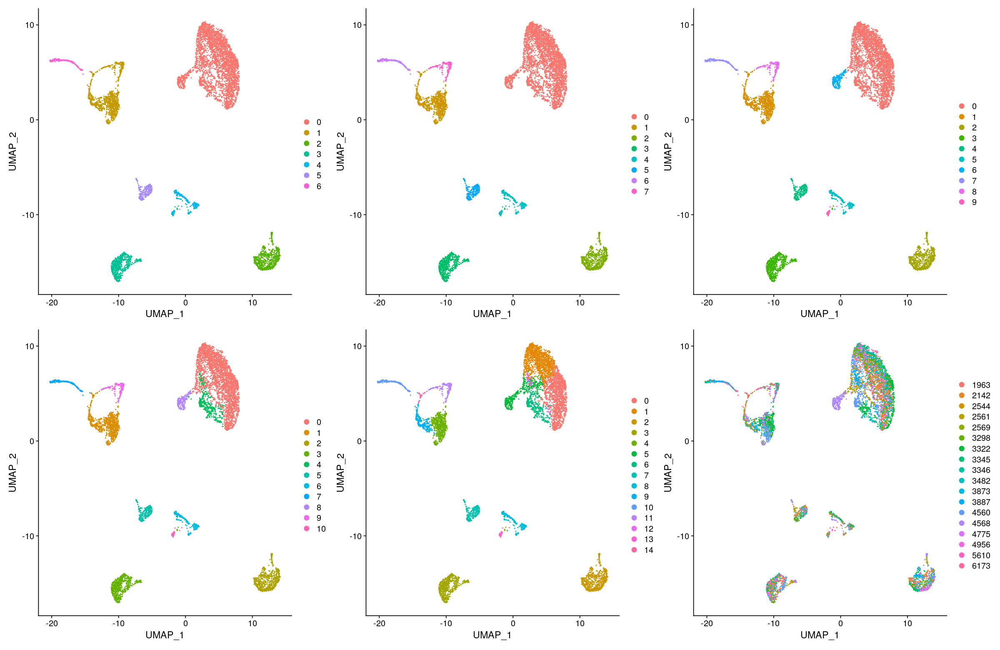

In [757]:
options(repr.plot.width=20, repr.plot.height=13)
plot1 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.0.01')
plot2 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.0.05')
plot3 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.0.075')
plot4 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.0.1')
plot5 <- DimPlot(seurat_object, reduction = "umap", group.by = 'RNA_snn_res.0.5')
plot6 <- DimPlot(seurat_object, reduction = "umap", group.by = "donor_id")
plot1 + plot2 + plot3 + plot4 + plot5 + plot6

In [758]:
Idents(seurat_object) <- 'RNA_snn_res.0.05'
table(Idents(seurat_object))


   0    1    2    3    4    5    6    7 
3403  897  673  639  309  266  202  174 

In [759]:
cntByPatient = table(Idents(seurat_object), seurat_object$donor_id)
cntByPatient = t(round(cntByPatient/rowSums(cntByPatient), 2))
cbind(sort(apply(cntByPatient, 2, max)))

3,0.10
2,0.11
0,0.12
5,0.13
4,0.17
1,0.30
7,0.43
6,0.68


### Differentially expressed genes / Markers

In [760]:
# Make sure you will use the chosen resolution:
table(Idents(seurat_object))


   0    1    2    3    4    5    6    7 
3403  897  673  639  309  266  202  174 

In [761]:
DEGs <- FindAllMarkers(seurat_object, only.pos=TRUE, min.pct=0.25)

# Save the markers for later
saveRDS(DEGs, file = "DEG.rds")

# To save as text:
write.table(DEGs, file = "DEGs.txt", sep = "\t", quote = F, col.names = F)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



#### Top markers for each cluster:

In [762]:
DEGs_top5 <- DEGs %>% group_by(cluster) %>% top_n(5, avg_logFC)
DEGs_top5

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,3.039647,0.994,0.341,0.000000e+00,0,ST18
0.000000e+00,2.853546,0.982,0.457,0.000000e+00,0,PLP1
0.000000e+00,2.730807,0.986,0.486,0.000000e+00,0,CTNNA3
0.000000e+00,2.321184,0.991,0.515,0.000000e+00,0,RNF220
0.000000e+00,2.264408,0.994,0.648,0.000000e+00,0,MBP
0.000000e+00,2.182917,0.928,0.178,0.000000e+00,1,LINGO2
0.000000e+00,2.146818,0.962,0.334,0.000000e+00,1,TENM2
0.000000e+00,2.027896,0.812,0.117,0.000000e+00,1,UNC5D
0.000000e+00,2.024769,0.932,0.222,0.000000e+00,1,CDH18


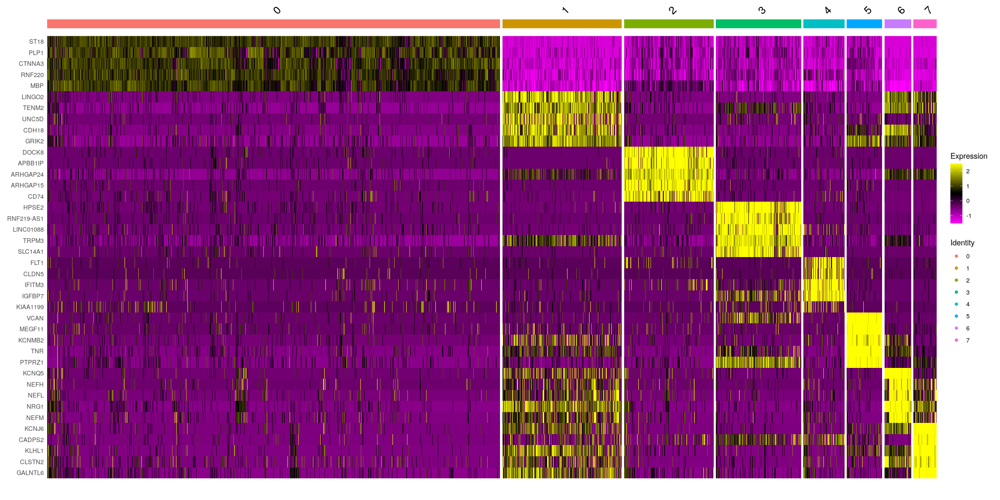

In [763]:
options(repr.plot.width=20, repr.plot.height=10)
DoHeatmap(seurat_object, features = DEGs_top5$gene)

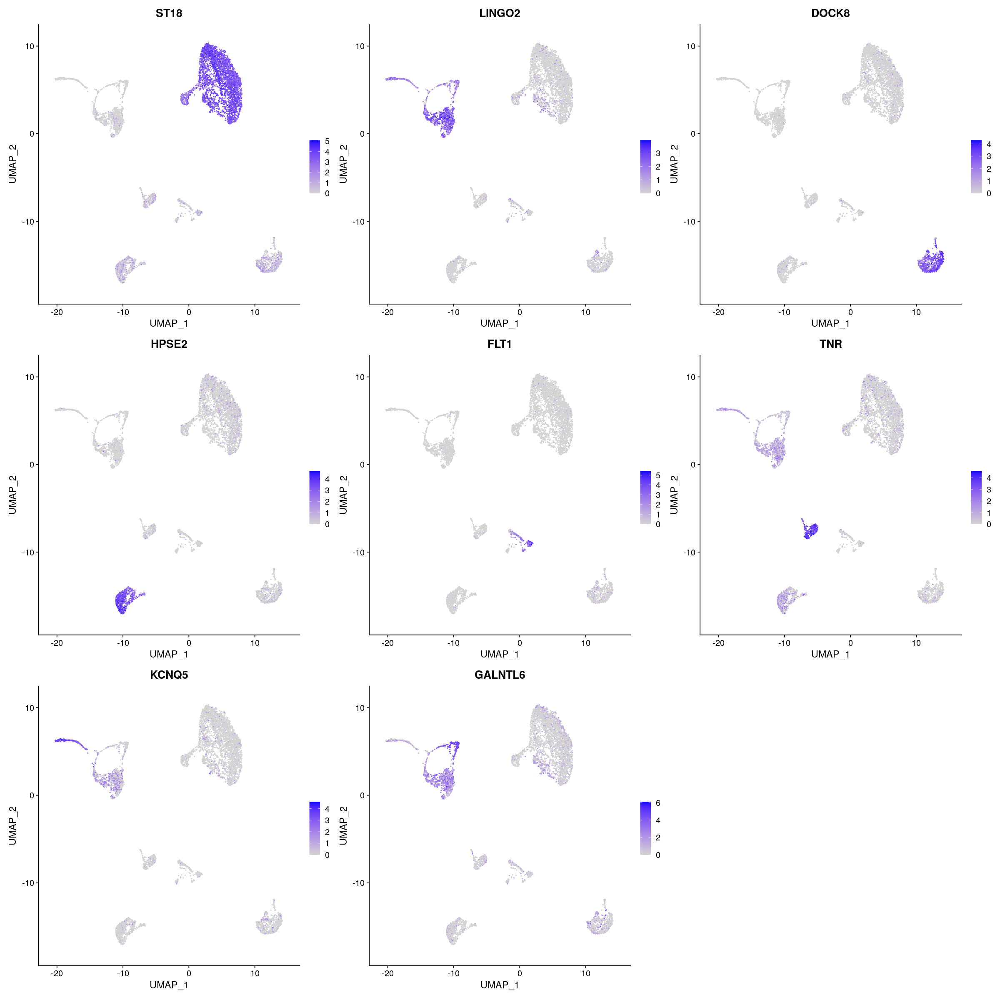

In [764]:
options(repr.plot.width=20, repr.plot.height=20)
top1 <- DEGs %>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
FeaturePlot(seurat_object, features = top1$gene)

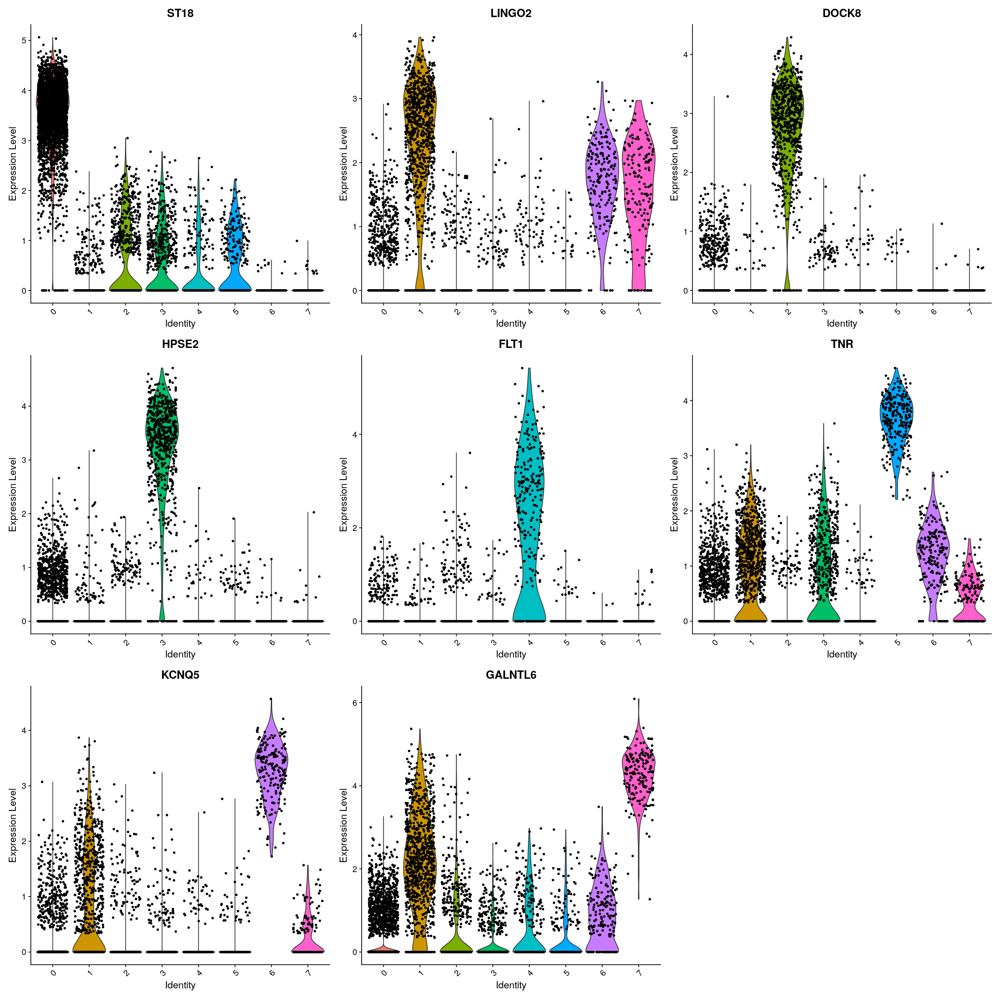

In [765]:
options(repr.plot.width=20, repr.plot.height=20)
top1 <- DEGs %>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
VlnPlot(seurat_object, features = top1$gene)

### Save your R object


In [766]:
save(file = "seurat_object_parkinson_nigra_filtered.RData", seurat_object)

In [802]:
load("seurat_object_parkinson_nigra_filtered.RData")

In [803]:
seurat_object[[]]

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,Cause_of_Death,FACS_Classification,AllData,percent.mt,RNA_snn_res.0.01,RNA_snn_res.0.05,RNA_snn_res.0.075,RNA_snn_res.0.1,RNA_snn_res.0.5,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB,21056,6877,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.0089286,3,3,3,3,3,3
pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB,11135,4520,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,0.7992815,3,3,3,3,3,3
pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB,15028,5685,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,6.8472185,4,4,5,6,8,8
pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB,13359,5260,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,1.5270604,4,4,9,10,13,13
pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1,pPDsHSrSNxi3482d200429PosB,11875,5224,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.8463158,4,4,5,6,8,8
pPDsHSrSNxi3482d200429PosB_TTCATTGCAGTGGCTC-1,pPDsHSrSNxi3482d200429PosB,10019,4346,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.2457331,4,4,5,6,8,8
pPDsHSrSNxi3482d200429PosB_CTGATCCGTGTTGATC-1,pPDsHSrSNxi3482d200429PosB,9296,4131,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,1.6888985,4,4,9,10,13,13
pPDsHSrSNxi3482d200429PosB_ACAGAAAAGGCCTAAG-1,pPDsHSrSNxi3482d200429PosB,9234,4359,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,2.7615335,4,4,5,6,8,8
pPDsHSrSNxi3482d200429PosB_CGAGGAACATGAAGGC-1,pPDsHSrSNxi3482d200429PosB,8166,3726,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,Coronary artery disease,Positive,AllData,4.7881460,4,4,5,6,8,8


### Cell type annotation


#### Scoring marker signatures with AUCell


###### Marker gene list

In [767]:
markersTable <- data.table::fread('/mnt/storage/r0878053/jupyternotebooks/parkinson_scRNA-seq/marker_gene_list//PanglaoDB_markers_27_Mar_2020.tsv.gz')
colnames(markersTable) <- gsub(' ', '_', colnames(markersTable))
head(markersTable)

species,official_gene_symbol,cell_type,nicknames,ubiquitousness_index,product_description,gene_type,canonical_marker,germ_layer,organ,sensitivity_human,sensitivity_mouse,specificity_human,specificity_mouse
<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Mm Hs,CTRB1,Acinar cells,CTRB,0.017,chymotrypsinogen B1,protein-coding gene,1,Endoderm,Pancreas,1.000000,0.957143,0.000628931,0.015920100
Mm Hs,KLK1,Acinar cells,Klk6,0.013,kallikrein 1,protein-coding gene,1,Endoderm,Pancreas,0.833333,0.314286,0.005031450,0.012826300
Mm Hs,RBPJL,Acinar cells,RBP-L|SUHL|RBPSUHL,0.001,recombination signal binding protein for immunoglobulin kappa J region like,protein-coding gene,1,Endoderm,Pancreas,0.000000,0.000000,0.000000000,0.000000000
Mm Hs,PTF1A,Acinar cells,PTF1-p48|bHLHa29,0.001,pancreas associated transcription factor 1a,protein-coding gene,1,Endoderm,Pancreas,0.000000,0.157143,0.000628931,0.000773445
Mm,TRY4,Acinar cells,NA,0.007,trypsin 4,protein coding gene,1,Endoderm,Pancreas,NA,NA,NA,NA
Mm Hs,CELA3A,Acinar cells,ELA3|ELA3A,0.001,chymotrypsin like elastase family member 3A,protein-coding gene,1,Endoderm,Pancreas,0.833333,0.128571,0.000000000,0.000000000


Since the table contains markers from mouse and human, let's select the ones from human:

In [768]:
markersTable <- markersTable[grep("Hs", markersTable$species),]
nrow(markersTable)

[1] 7851

In [769]:
## Number of cell types per tissue: 
cbind(table(unique(markersTable[,c('cell_type', 'organ')])$organ))

Adrenal glands,1
Blood,4
Bone,5
Brain,34
Connective tissue,5
Embryo,5
Epithelium,3
Eye,3
GI tract,13
Heart,4
Immune system,25


To make the analysis more specific and avoid too many false positives and noise, let's focus on the organs/tissues that are most likely to have cell types in our dataset (since it is parkinson's disease: mostly brain tissue): 

In [770]:
markersTableSS <- markersTable
markersTableSS <- markersTableSS[markersTableSS$organ %in% c('Brain', 'Blood', 'Vasculature', 'Heart'),]
nrow(markersTableSS)

[1] 2241

Let's format the markers as gene-sets (the format required by AUCell, and most enrichment tools)

In [771]:
## Format as GeneSets
geneSets <- split(markersTableSS$official_gene_symbol, markersTableSS$cell_type)
geneSets <- geneSets[lengths(geneSets) >= 10] # Down to 10 it might be ok
geneSets <- setNames(geneSets, paste(names(geneSets), " (", lengths(geneSets) ,"g)", sep=""))
length(geneSets)

[1] 38

In [772]:
cbind(lengths(geneSets))

Anterior pituitary gland cells (33g),33
Astrocytes (63g),63
Bergmann glia (41g),41
Cajal-Retzius cells (78g),78
Cardiac stem and precursor cells (18g),18
Cardiomyocytes (104g),104
Choroid plexus cells (21g),21
Dopaminergic neurons (21g),21
Endothelial cells (187g),187
Endothelial cells (aorta) (89g),89
Endothelial cells (blood brain barrier) (16g),16


##### Score with AUCell

In [773]:
library(AUCell) 
require(scales)

In [774]:
# Score gene-sets on the cells
# note: current version of aucell is faster. Use AUCell_run() instead of these two functions.
cells_rankings <- AUCell_buildRankings(seurat_object@assays$RNA[], plotStats=FALSE)
cells_AUC <- AUCell_calcAUC(geneSets, cells_rankings)

Quantiles for the number of genes detected by cell: 
(Non-detected genes are shuffled at the end of the ranking. Keep it in mind when choosing the threshold for calculating the AUC).



   min     1%     5%    10%    50%   100% 
1000.0 1048.0 1259.1 1495.4 3035.0 8023.0 


Genes in the gene sets NOT available in the dataset: 
	Anterior pituitary gland cells (33g): 	7 (21% of 33)
	Astrocytes (63g): 	3 (5% of 63)
	Bergmann glia (41g): 	1 (2% of 41)
	Cajal-Retzius cells (78g): 	4 (5% of 78)
	Cardiac stem and precursor cells (18g): 	3 (17% of 18)
	Cardiomyocytes (104g): 	12 (12% of 104)
	Dopaminergic neurons (21g): 	2 (10% of 21)
	Endothelial cells (187g): 	18 (10% of 187)
	Endothelial cells (aorta) (89g): 	5 (6% of 89)
	Ependymal cells (56g): 	1 (2% of 56)
	Erythroblasts (26g): 	1 (4% of 26)
	Erythroid-like and erythroid precursor cells (70g): 	7 (10% of 70)
	Immature neurons (38g): 	3 (8% of 38)
	Interneurons (217g): 	9 (4% of 217)
	Meningeal cells (18g): 	1 (6% of 18)
	Microglia (71g): 	3 (4% of 71)
	Motor neurons (13g): 	4 (31% of 13)
	Neural stem/precursor cells (57g): 	7 (12% of 57)
	Neuroblasts (50g): 	8 (16% of 50)
	Neurons (203g): 	9 (4% of 203)
	Oligodendrocyte progenitor cells (28g): 	2 (7% of 28)
	Oligodendrocytes (88g): 	1 (1% of 88)
	Platelets 

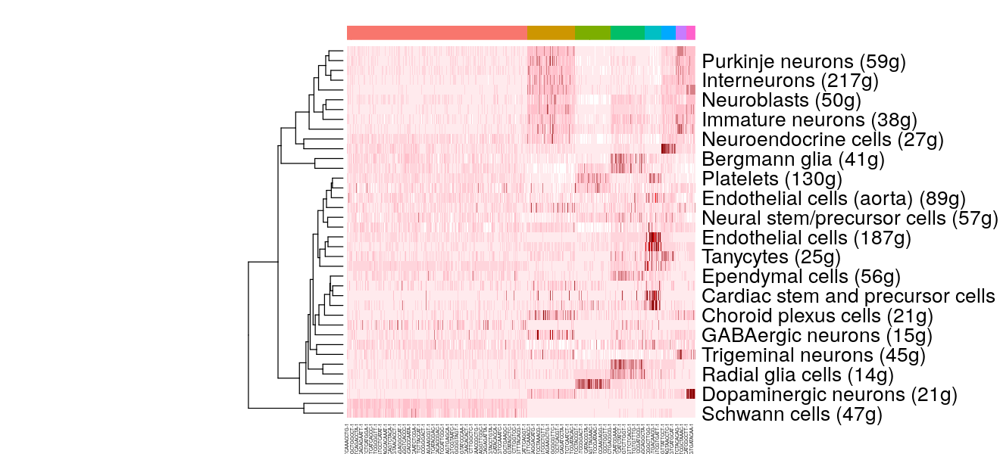

In [791]:
## Order cells by cluster & select colors
clusterOrder <- levels(seurat_object$`RNA_snn_res.0.05`)
sampleOrderBySubtype <- sort(match(seurat_object$`RNA_snn_res.0.05`, clusterOrder),index.return=TRUE)$ix
clusterColors <- setNames(hue_pal()(length(clusterOrder)), clusterOrder)

## Plot as heatmap
set.seed(123)
heatmap(getAUC(cells_AUC)[,sampleOrderBySubtype], 
        Colv=NA, scale="row", margins=c(3,5), 
        col=grDevices::colorRampPalette(c("white","pink","darkred", "red"))(10), 
        ColSideColors=rep(clusterColors, times=table(seurat_object$`RNA_snn_res.0.05`)[names(clusterColors)]),
        cexRow=2, main=" \n ")

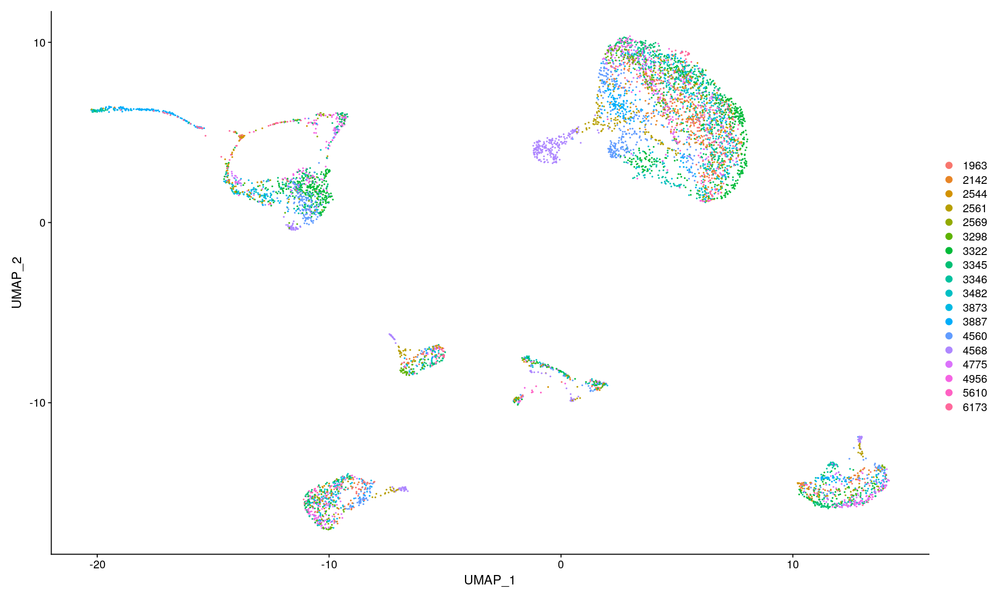

In [776]:
# Plot by patients (donor_id)
# no clear batch effect

options(repr.plot.width=15, repr.plot.height=9)
plot1 <- DimPlot(seurat_object, reduction = "umap", group.by = "donor_id")
plot1

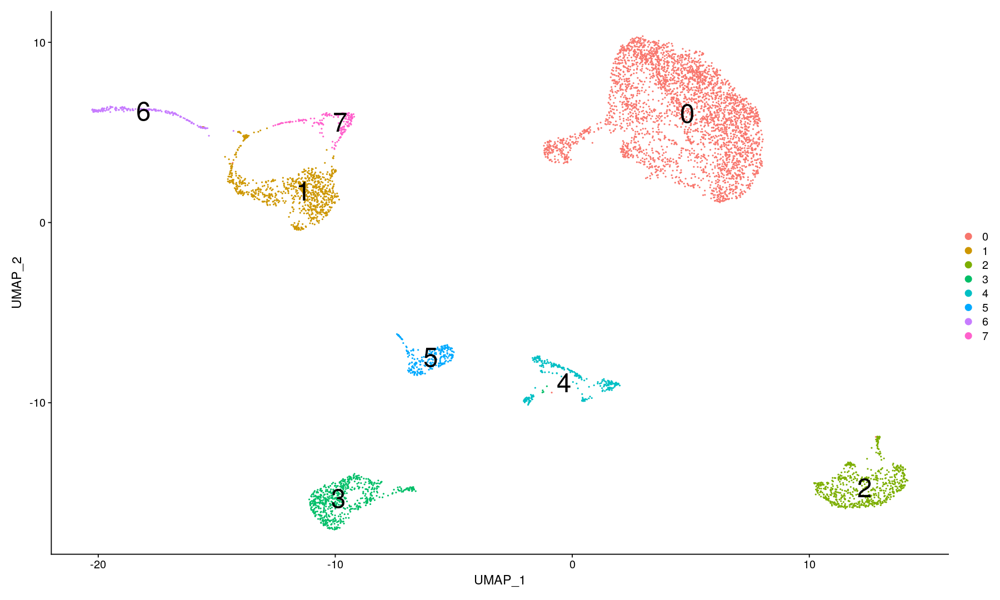

In [777]:
# Plot
options(repr.plot.width=15, repr.plot.height=9)
plot2 <- DimPlot(seurat_object, reduction = "umap", label = TRUE, label.size = 10)
plot2

In [778]:
options(repr.plot.width=11, repr.plot.height=5)
plot1 <- FeaturePlot(seurat_object, features = c('TH', 'SLC6A3')) #dopaminergic_neurons
plot2 <- FeaturePlot(seurat_object, features = c('AQP4', 'VCAN')) #astrocytes
plot3 <- FeaturePlot(seurat_object, features = c('OLIG1')) #oligodendrocytes
plot4 <- FeaturePlot(seurat_object, features = c('VCAN', 'OLIG1')) #oligodendrocyte_progenitor_cells
plot5 <- FeaturePlot(seurat_object, features = c('CLDN5')) #endothelial_cells/pericytes
plot6 <- FeaturePlot(seurat_object, features = c('CX3CR1')) #microglia
plot7 <- FeaturePlot(seurat_object, features = c('RBFOX3', 'RIT2')) #non-DA neurons
plot8 <- FeaturePlot(seurat_object, features = c('GAD1', 'GAD2')) #gaba_neurons

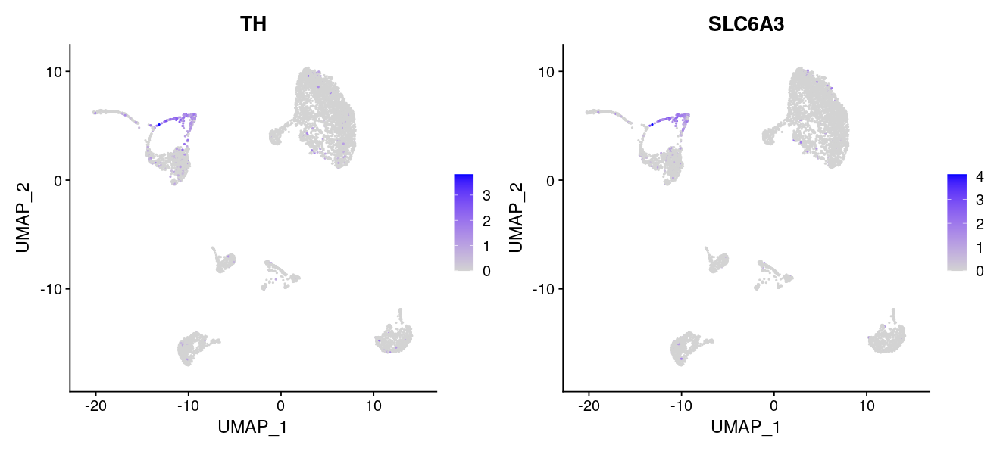

In [779]:
# dopaminergic neurons
plot1

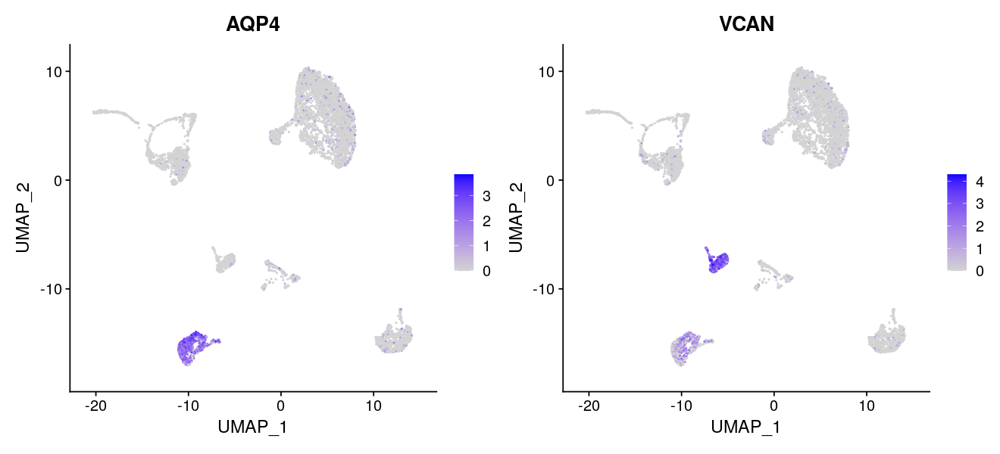

In [780]:
# astrocytes
plot2

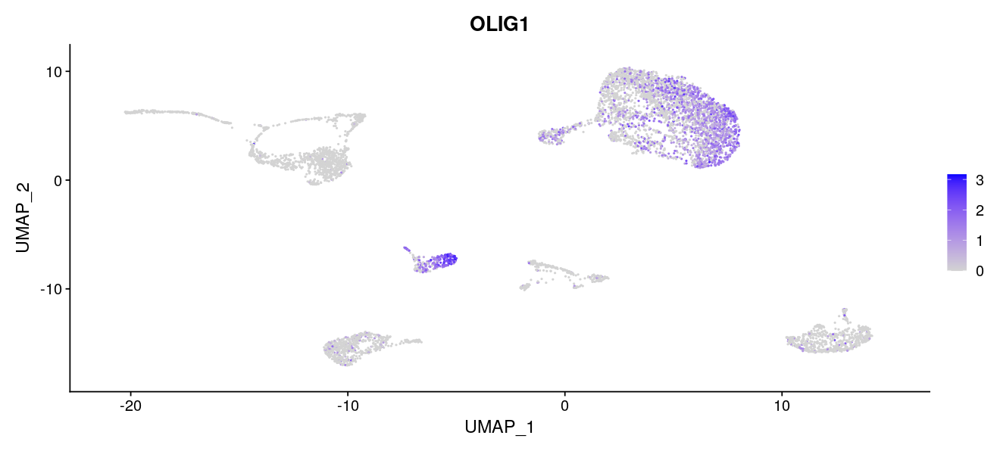

In [781]:
# oligodendrocytes
plot3

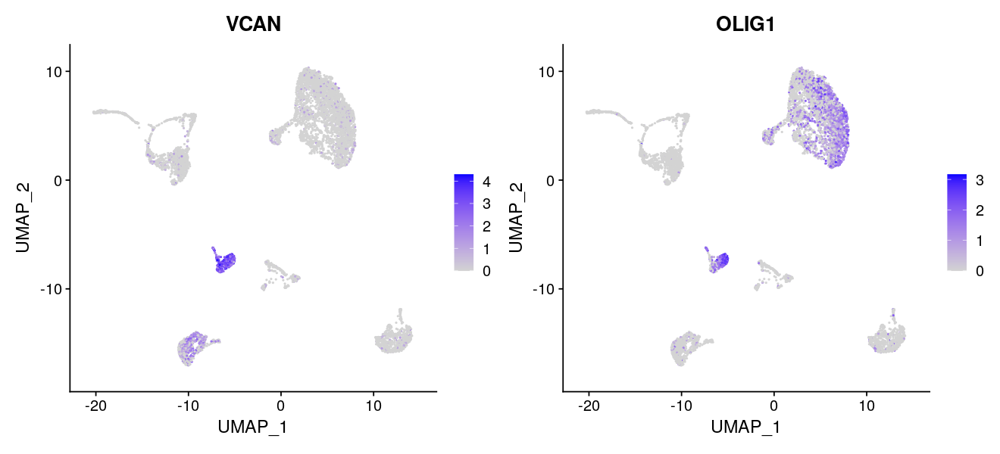

In [782]:
# oligodendrocyte progenitor cells
plot4

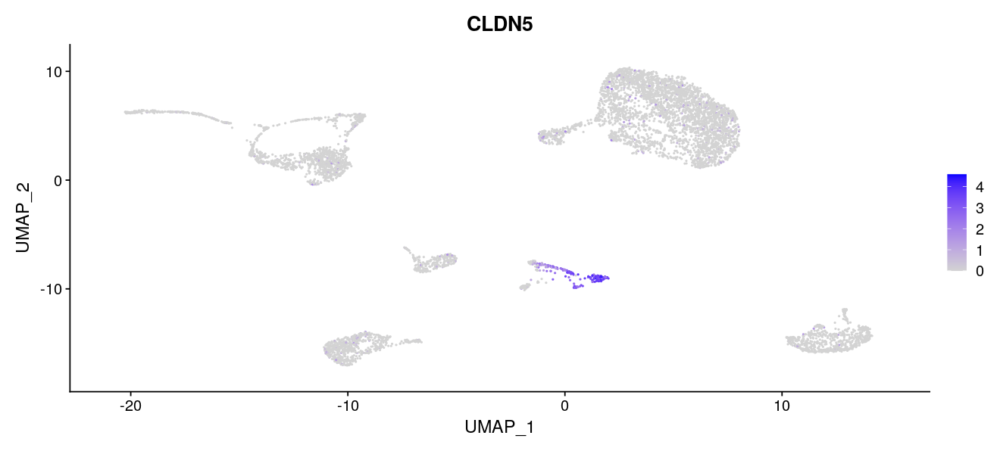

In [783]:
# endothelial_cells/pericytes
plot5

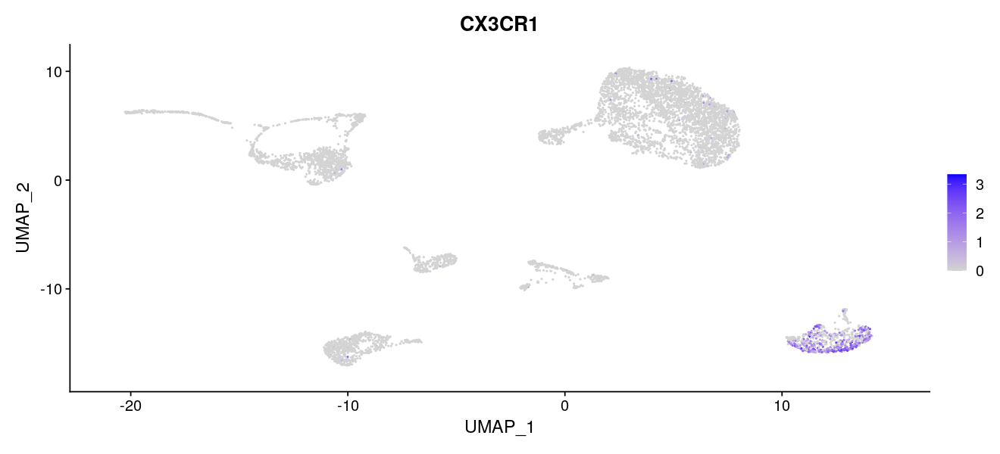

In [784]:
# microglia
plot6

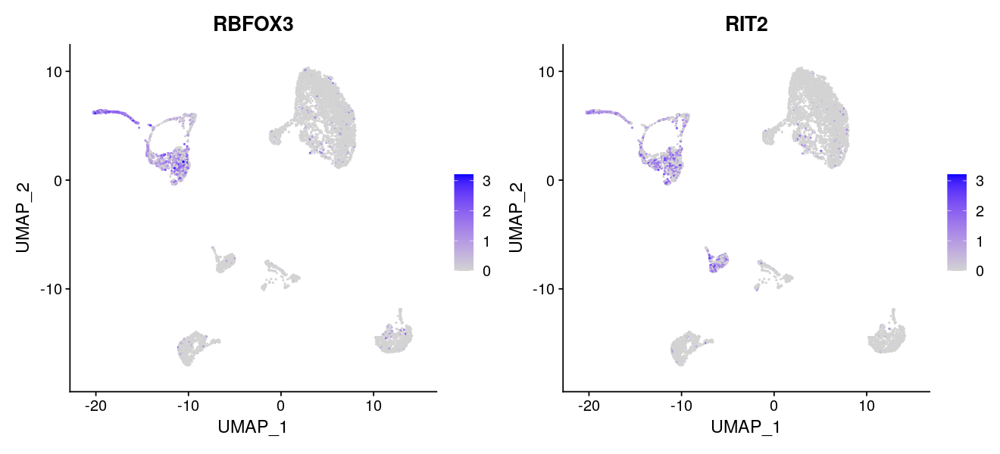

In [785]:
# non-DA neurons
plot7

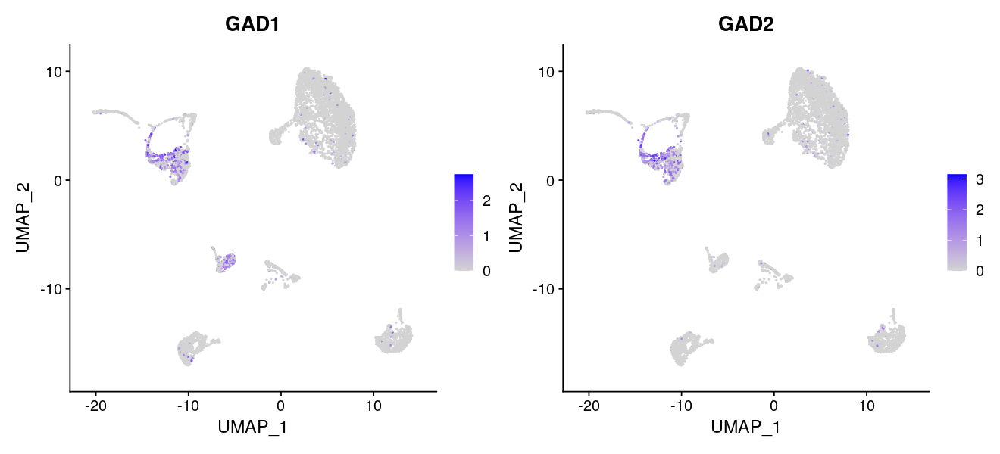

In [786]:
# GABA neurons
plot8

In [801]:
seurat_object[[]]

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,⋯,FACS_Classification,AllData,percent.mt,RNA_snn_res.0.01,RNA_snn_res.0.05,RNA_snn_res.0.075,RNA_snn_res.0.1,RNA_snn_res.0.5,seurat_clusters,major_celltype
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB,21056,6877,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.0089286,3,ASTR,3,3,3,3,ASTR
pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB,11135,4520,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,0.7992815,3,ASTR,3,3,3,3,ASTR
pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB,15028,5685,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,6.8472185,4,END/PER,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB,13359,5260,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,1.5270604,4,END/PER,9,10,13,13,END/PER
pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1,pPDsHSrSNxi3482d200429PosB,11875,5224,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.8463158,4,END/PER,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_TTCATTGCAGTGGCTC-1,pPDsHSrSNxi3482d200429PosB,10019,4346,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.2457331,4,END/PER,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_CTGATCCGTGTTGATC-1,pPDsHSrSNxi3482d200429PosB,9296,4131,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,1.6888985,4,END/PER,9,10,13,13,END/PER
pPDsHSrSNxi3482d200429PosB_ACAGAAAAGGCCTAAG-1,pPDsHSrSNxi3482d200429PosB,9234,4359,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.7615335,4,END/PER,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_CGAGGAACATGAAGGC-1,pPDsHSrSNxi3482d200429PosB,8166,3726,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,4.7881460,4,END/PER,5,6,8,8,END/PER


In [804]:
# Save old identity classes (the cluster labels) for reference.
seurat_object[["RNA_snn_res.0.05"]] <- Idents(object = seurat_object)

# Rename classes.
seurat_object <- RenameIdents(object = seurat_object, `0` = "OLG", `1` = "GABA", `2` = "MG", `3` = "ASTR", `4` = "END/PER", `5` = "OPC", `6` = "non-DA", `7` = "DA" )

# Create column with celltypes
seurat_object[["major_celltype"]] <- Idents(object = seurat_object)

In [805]:
seurat_object[[]]

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,⋯,FACS_Classification,AllData,percent.mt,RNA_snn_res.0.01,RNA_snn_res.0.05,RNA_snn_res.0.075,RNA_snn_res.0.1,RNA_snn_res.0.5,seurat_clusters,major_celltype
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
pPDsHSrSNxi3482d200429PosB_TCCGAAAGTTGCTGAT-1,pPDsHSrSNxi3482d200429PosB,21056,6877,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.0089286,3,3,3,3,3,3,ASTR
pPDsHSrSNxi3482d200429PosB_ACCTACCAGGGCATGT-1,pPDsHSrSNxi3482d200429PosB,11135,4520,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,0.7992815,3,3,3,3,3,3,ASTR
pPDsHSrSNxi3482d200429PosB_AGCCAGCGTTGCACGC-1,pPDsHSrSNxi3482d200429PosB,15028,5685,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,6.8472185,4,4,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_TAGGTACTCATTGCCC-1,pPDsHSrSNxi3482d200429PosB,13359,5260,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,1.5270604,4,4,9,10,13,13,END/PER
pPDsHSrSNxi3482d200429PosB_GACTATGAGCTAAACA-1,pPDsHSrSNxi3482d200429PosB,11875,5224,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.8463158,4,4,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_TTCATTGCAGTGGCTC-1,pPDsHSrSNxi3482d200429PosB,10019,4346,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.2457331,4,4,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_CTGATCCGTGTTGATC-1,pPDsHSrSNxi3482d200429PosB,9296,4131,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,1.6888985,4,4,9,10,13,13,END/PER
pPDsHSrSNxi3482d200429PosB_ACAGAAAAGGCCTAAG-1,pPDsHSrSNxi3482d200429PosB,9234,4359,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,2.7615335,4,4,5,6,8,8,END/PER
pPDsHSrSNxi3482d200429PosB_CGAGGAACATGAAGGC-1,pPDsHSrSNxi3482d200429PosB,8166,3726,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,4.7881460,4,4,5,6,8,8,END/PER


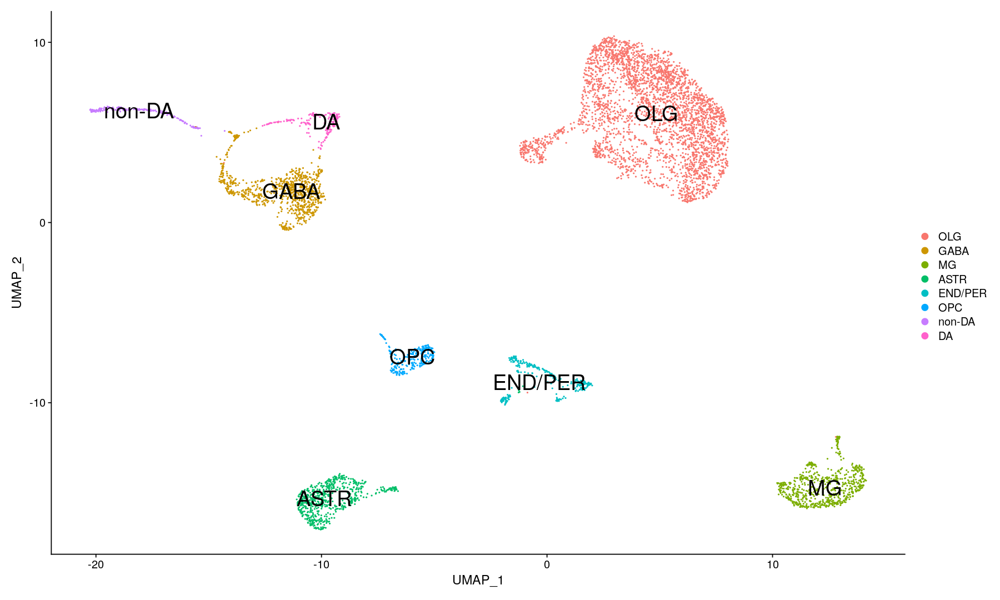

In [806]:
# Plot
options(repr.plot.width=15, repr.plot.height=9)
plot <- DimPlot(seurat_object, reduction = "umap", label = TRUE, label.size = 8)
plot

In [ ]:
DEGs[DEGs$gene %in% c('TH', 'SLC6A3', 'AQP4', 'VCAN', 'OLIG1', 'CLDN5', 'CX3CR1', 'RBFOX3'),]

- RBFOX3 is assigned both to DA and Non-DA clusters but should be Non-DA only
- TH is assigned to Non-DA cluster but should be DA
- VCAN is assigned both to ASTR and OPC but should be OPC only

- the rest is assigned correctly

In [808]:
# set color per celltype
cellColors = c('OLG'='red',
    'non-DA'='purple', 
    'MG'='green', 
    'ASTR'='darkgreen',
    'END/PER'='turquoise ', 
    'OPC'='royalblue',  
    'DA'='pink',
    'GABA'='yellow'
     )

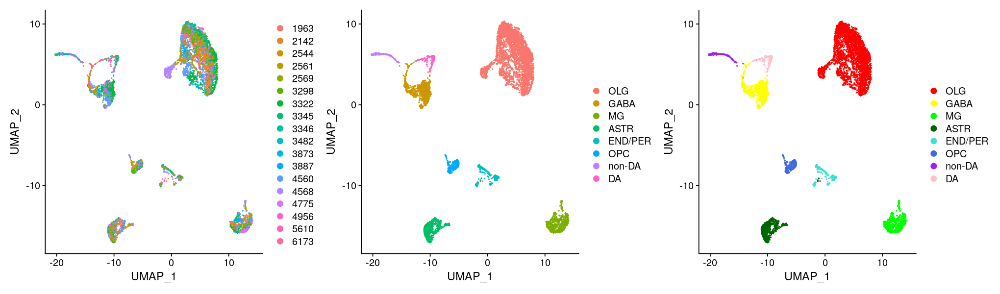

In [809]:
# Plot
options(repr.plot.width=17, repr.plot.height=5)
plot1 <- DimPlot(seurat_object, reduction = "umap", group.by = "donor_id")
plot2 <- DimPlot(seurat_object, reduction = "umap")
plot3 <- DimPlot(seurat_object, reduction = "umap", group.by = "major_celltype", cols=cellColors)
plot1 + plot2 + plot3

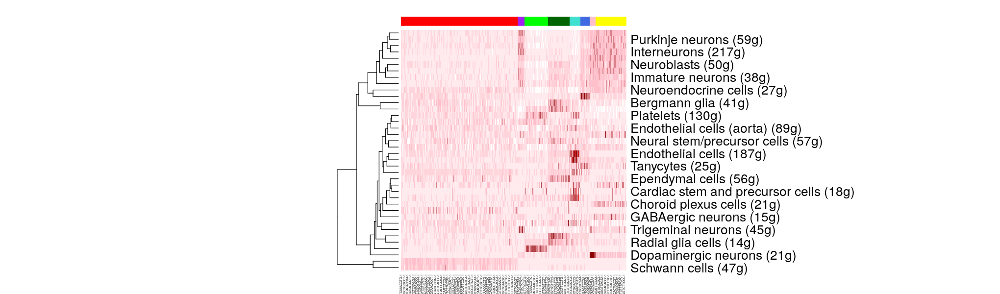

In [810]:
## Marker gene sets compared to cell type labels
sampleOrderBySubtype <- sort(match(seurat_object$major_celltype, names(cellColors)),index.return=TRUE)$ix

set.seed(123)
heatmap(getAUC(cells_AUC)[,sampleOrderBySubtype], 
        Colv=NA, scale="row", margins=c(3,5), 
        col=grDevices::colorRampPalette(c("white","pink","darkred", "red"))(10), 
        ColSideColors=rep(cellColors, times=table(seurat_object$major_celltype)[names(cellColors)]),
        cexRow=2, main=" \n ")

In [ ]:
seurat_object[[]]

# Sub-clustering analysis for DA neurons

In [811]:
seurat_object_DA <- subset(seurat_object, subset = major_celltype == "DA")

In [812]:
seurat_object_DA[[]]

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,⋯,FACS_Classification,AllData,percent.mt,RNA_snn_res.0.01,RNA_snn_res.0.05,RNA_snn_res.0.075,RNA_snn_res.0.1,RNA_snn_res.0.5,seurat_clusters,major_celltype
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
pPDsHSrSNxi3482d200429PosB_TGGTGATTCTTTCCGG-1,pPDsHSrSNxi3482d200429PosB,24821,5866,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,Positive,AllData,5.2777890,1,7,8,9,11,11,DA
pPDsHSrSNxi3346d200429PosB_CAGCCAGCATCGCCTT-1,pPDsHSrSNxi3346d200429PosB,11715,4557,pPDsHSrSNxi3346d200429PosB,3346,normal,substantia nigra pars compacta,female,91,Ctrl,⋯,Positive,AllData,1.9632949,1,7,8,9,11,11,DA
pPDsHSrSNxi3346d200429PosB_CATTGAGTCCCTTGTG-1,pPDsHSrSNxi3346d200429PosB,5509,1989,pPDsHSrSNxi3346d200429PosB,3346,normal,substantia nigra pars compacta,female,91,Ctrl,⋯,Positive,AllData,1.5066255,1,7,8,9,11,11,DA
pPDsHSrSNxi3873d200429PosA_CTTGATTGTAGTTACC-1,pPDsHSrSNxi3873d200429PosA,19683,4799,pPDsHSrSNxi3873d200429PosA,3873,Parkinson disease,substantia nigra pars compacta,female,76,PD,⋯,Positive,AllData,8.3777879,1,7,8,9,11,11,DA
pPDsHSrSNxi5610d200429Pos_GATGTTGGTTCGAGCC-1,pPDsHSrSNxi5610d200429Pos,20686,5467,pPDsHSrSNxi5610d200429Pos,5610,normal,substantia nigra pars compacta,female,49,Ctrl,⋯,Positive,AllData,4.0993909,1,7,8,9,11,11,DA
pPDsHSrSNxi5610d200429Pos_CGAGAAGTCGAGAAAT-1,pPDsHSrSNxi5610d200429Pos,14466,4486,pPDsHSrSNxi5610d200429Pos,5610,normal,substantia nigra pars compacta,female,49,Ctrl,⋯,Positive,AllData,5.3090004,1,7,8,9,11,11,DA
pPDsHSrSNxi4956d200429PosA_TAATCTCAGGATCACG-1,pPDsHSrSNxi4956d200429PosA,24870,5111,pPDsHSrSNxi4956d200429PosA,4956,normal,substantia nigra pars compacta,female,92,Ctrl,⋯,Positive,AllData,2.3642943,1,7,8,9,11,11,DA
pPDsHSrSNxi4956d200429PosA_TGGTGATTCGCGGACT-1,pPDsHSrSNxi4956d200429PosA,24843,5505,pPDsHSrSNxi4956d200429PosA,4956,normal,substantia nigra pars compacta,female,92,Ctrl,⋯,Positive,AllData,1.1753814,1,7,8,9,11,11,DA
pPDsHSrSNxi4956d200429PosA_CAGTTCCGTCAACCAT-1,pPDsHSrSNxi4956d200429PosA,24677,5889,pPDsHSrSNxi4956d200429PosA,4956,normal,substantia nigra pars compacta,female,92,Ctrl,⋯,Positive,AllData,1.5398954,1,7,8,9,11,11,DA


### Find variable genes

In [813]:
seurat_object_DA <- FindVariableFeatures(seurat_object_DA)

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”


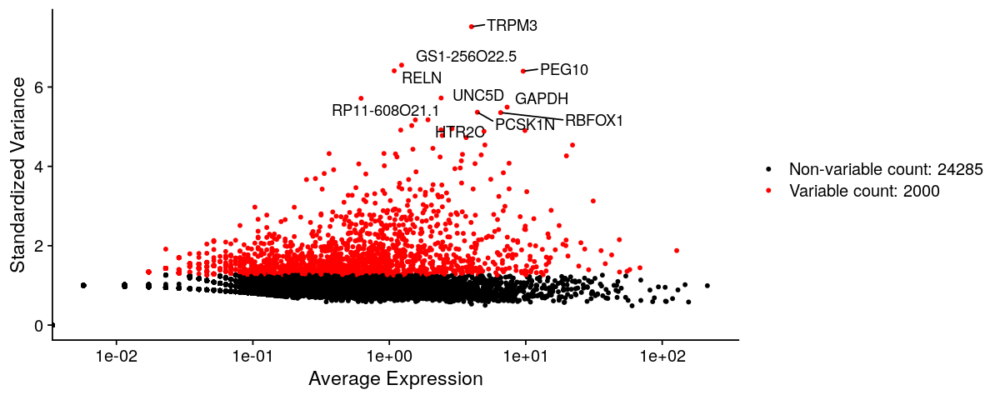

In [814]:
# plot variable features for control samples
options(repr.plot.width=10, repr.plot.height=4)
plot1 <- VariableFeaturePlot(seurat_object_DA)
LabelPoints(plot=plot1, points=VariableFeatures(seurat_object_DA)[1:10], repel = TRUE)

### Scaling the data

In [815]:
allGenes <- rownames(seurat_object_DA)
seurat_object_DA <- ScaleData(seurat_object_DA, features = allGenes)

Centering and scaling data matrix



### Dimensionality reduction (PCA)

In [816]:
seurat_object_DA <- RunPCA(seurat_object_DA, ndims.print = 1:3, nfeatures.print = 5)

PC_ 1 
Positive:  RNA28S5, RP11-624C23.1, SEZ6L, DPYD, XIST 
Negative:  BEX1, PCSK1N, GAPDH, SRP14, TUBB2A 
PC_ 2 
Positive:  CDH4, SHISA6, SLC35F4, FGF14, SCN1A 
Negative:  SOX6, GRM5, COL11A1, CALN1, UNC13C 
PC_ 3 
Positive:  ALCAM, LRRTM4, EBF1, LUZP2, HTR4 
Negative:  TENM2, CDH6, COL14A1, RBFOX1, IL1RAPL2 



In [817]:
print(seurat_object_DA[["pca"]], dims = 1:4, nfeatures = 20)

PC_ 1 
Positive:  RNA28S5, RP11-624C23.1, SEZ6L, DPYD, XIST, GPC6, DAB1, NKAIN2, ROBO1, CUX2 
	   RORA, ATRNL1, RP11-611E13.2, SYN3, HS6ST3, NEGR1, FER, EPHA6, HECW1, PKNOX2 
Negative:  BEX1, PCSK1N, GAPDH, SRP14, TUBB2A, TCEB2, NGFRAP1, PEBP1, PRDX2, SEPW1 
	   COX4I1, RABAC1, SNCG, ATPIF1, CKB, UBB, ALDOA, ATP6V0E2, FBXO2, DDX24 
PC_ 2 
Positive:  CDH4, SHISA6, SLC35F4, FGF14, SCN1A, FOXP2, GRIN2A, GRM8, SORCS3, VWA5B1 
	   HTR2C, CACNG3, RP1-34H18.1, CHN2, TRPM3, PLXNC1, TEAD1, GPC6, NKAIN2, CDH13 
Negative:  SOX6, GRM5, COL11A1, CALN1, UNC13C, DPP10, EYA4, PLD5, BAI3, SPOCK3 
	   GBE1, EPHA7, MIR181A1HG, KHDRBS2, LMO3, PTPN13, SEMA3E, RERG, RORA, MAN2A1 
PC_ 3 
Positive:  ALCAM, LRRTM4, EBF1, LUZP2, HTR4, CNTN5, MAML2, KCND2, TRPC5, ASTN2 
	   CNTNAP5, CDH10, PCDH17, PLCXD3, ALDH1A1, FAM19A2, BAI3, TCF4, LMO3, PDE1C 
Negative:  TENM2, CDH6, COL14A1, RBFOX1, IL1RAPL2, NTNG1, PBX3, PTPRG, DGKB, SEZ6L 
	   PLCB4, VAV3, SLC24A4, TMTC2, ZBTB7C, RPH3A, SULF2, ZNF385B, MT-RNR1, SMOC1 
PC_

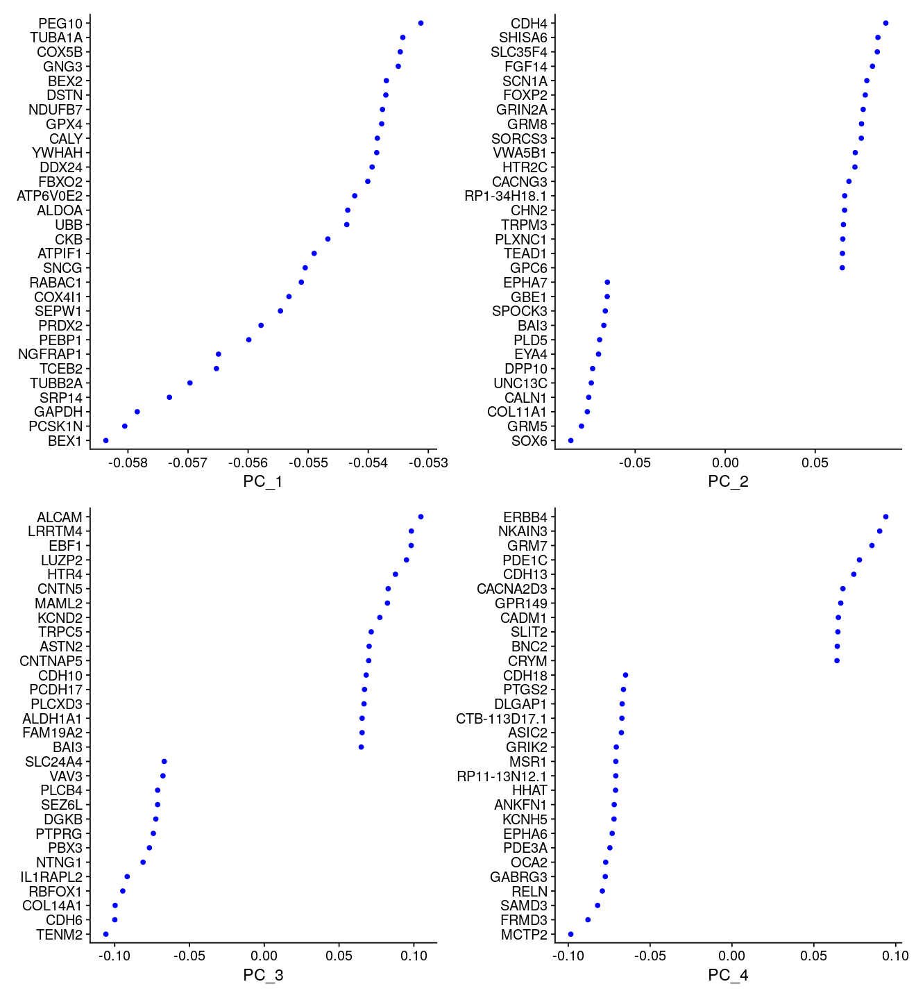

In [818]:
options(repr.plot.width=11, repr.plot.height=12)
VizDimLoadings(seurat_object_DA, dims = 1:4, reduction = "pca")

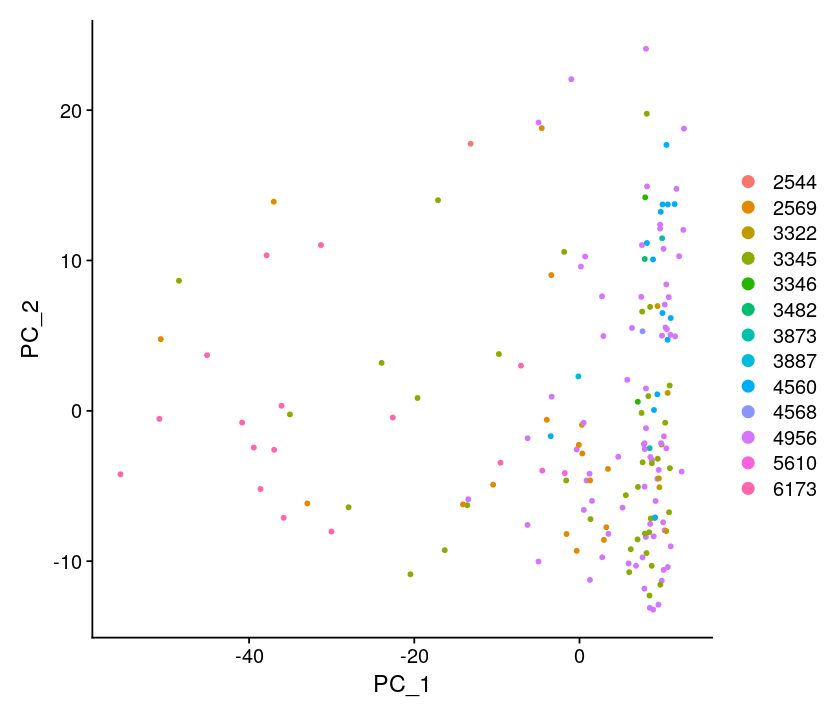

In [819]:
options(repr.plot.width=7, repr.plot.height=6)
DimPlot(seurat_object_DA, reduction = "pca", group.by = "donor_id")

Warning message:
“Requested number is larger than the number of available items (174). Setting to 174.”
Warning message:
“Requested number is larger than the number of available items (174). Setting to 174.”


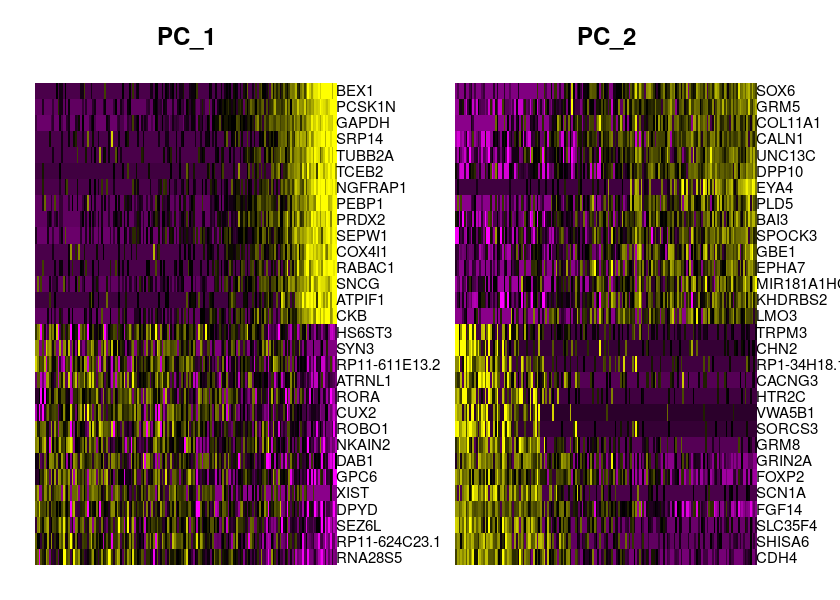

In [820]:
options(repr.plot.width=7, repr.plot.height=5)
DimHeatmap(seurat_object_DA, dims = 1:2, cells = 500, balanced = TRUE)

### Clustering the cells

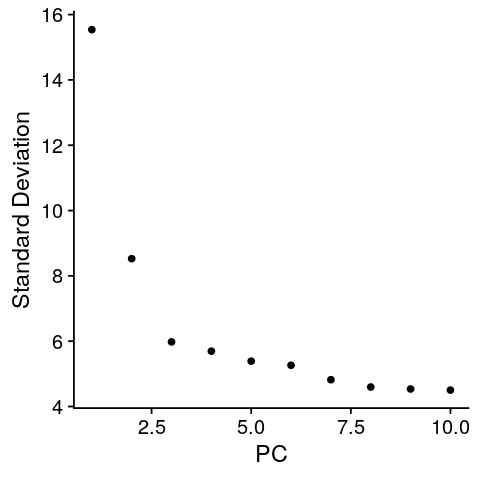

In [821]:
options(repr.plot.width=4, repr.plot.height=4)
ElbowPlot(seurat_object_DA, ndims=10)

In [822]:
seurat_object_DA <- FindNeighbors(seurat_object_DA, dims = 1:4)
seurat_object_DA <- FindClusters(seurat_object_DA, resolution = c(0.01, 0.1, 0.5, 1.0, 2.0))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 174
Number of edges: 4154

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9900
Number of communities: 1
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 174
Number of edges: 4154

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9000
Number of communities: 1
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 174
Number of edges: 4154

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7154
Number of communities: 4
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 174
Number of edges: 4154

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5854
Number of communities: 5
Elapsed time: 0 seconds
Modularity Optimizer version 1.3

In [823]:
head(seurat_object_DA[[]])

,orig.ident,nCount_RNA,nFeature_RNA,biosample_id,donor_id,disease__ontology_label,organ__ontology_label,sex,Donor_Age,Status,⋯,percent.mt,RNA_snn_res.0.01,RNA_snn_res.0.05,RNA_snn_res.0.075,RNA_snn_res.0.1,RNA_snn_res.0.5,seurat_clusters,major_celltype,RNA_snn_res.1,RNA_snn_res.2
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
pPDsHSrSNxi3482d200429PosB_TGGTGATTCTTTCCGG-1,pPDsHSrSNxi3482d200429PosB,24821,5866,pPDsHSrSNxi3482d200429PosB,3482,normal,substantia nigra pars compacta,female,79,Ctrl,⋯,5.277789,0,7,8,0,1,0,DA,0,0
pPDsHSrSNxi3346d200429PosB_CAGCCAGCATCGCCTT-1,pPDsHSrSNxi3346d200429PosB,11715,4557,pPDsHSrSNxi3346d200429PosB,3346,normal,substantia nigra pars compacta,female,91,Ctrl,⋯,1.963295,0,7,8,0,1,7,DA,0,7
pPDsHSrSNxi3346d200429PosB_CATTGAGTCCCTTGTG-1,pPDsHSrSNxi3346d200429PosB,5509,1989,pPDsHSrSNxi3346d200429PosB,3346,normal,substantia nigra pars compacta,female,91,Ctrl,⋯,1.506626,0,7,8,0,0,6,DA,2,6
pPDsHSrSNxi3873d200429PosA_CTTGATTGTAGTTACC-1,pPDsHSrSNxi3873d200429PosA,19683,4799,pPDsHSrSNxi3873d200429PosA,3873,Parkinson disease,substantia nigra pars compacta,female,76,PD,⋯,8.377788,0,7,8,0,0,5,DA,2,5
pPDsHSrSNxi5610d200429Pos_GATGTTGGTTCGAGCC-1,pPDsHSrSNxi5610d200429Pos,20686,5467,pPDsHSrSNxi5610d200429Pos,5610,normal,substantia nigra pars compacta,female,49,Ctrl,⋯,4.099391,0,7,8,0,3,1,DA,4,1
pPDsHSrSNxi5610d200429Pos_CGAGAAGTCGAGAAAT-1,pPDsHSrSNxi5610d200429Pos,14466,4486,pPDsHSrSNxi5610d200429Pos,5610,normal,substantia nigra pars compacta,female,49,Ctrl,⋯,5.309000,0,7,8,0,3,1,DA,4,1


In [824]:
# How many clusters are there in each resolution?
for (x in c('RNA_snn_res.0.01', 'RNA_snn_res.0.1', 'RNA_snn_res.0.5', 'RNA_snn_res.1', 'RNA_snn_res.2'))
{
    message(x, ': ', length(unique(unlist(seurat_object_DA[[x]]))), ' clusters')
}

RNA_snn_res.0.01: 1 clusters

RNA_snn_res.0.1: 1 clusters

RNA_snn_res.0.5: 4 clusters

RNA_snn_res.1: 5 clusters

RNA_snn_res.2: 8 clusters



In [825]:
# How many cells are assigned by cluster?
table(Idents(seurat_object_DA))


 0  1  2  3  4  5  6  7 
31 24 23 23 20 19 18 16 

### 2D projections 


In [826]:
# tSNE
seurat_object_DA <- RunTSNE(seurat_object_DA, dims = 1:4)
# UMAP
seurat_object_DA <- RunUMAP(seurat_object_DA, dims = 1:4)

05:51:01 UMAP embedding parameters a = 0.9922 b = 1.112

05:51:01 Read 174 rows and found 4 numeric columns

05:51:01 Using Annoy for neighbor search, n_neighbors = 30

05:51:01 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

05:51:01 Writing NN index file to temp file /tmp/Rtmpzy6c8E/file26e8d73f85c807

05:51:01 Searching Annoy index using 1 thread, search_k = 3000

05:51:02 Annoy recall = 100%

05:51:02 Commencing smooth kNN distance calibration using 1 thread

05:51:04 Initializing from normalized Laplacian + noise

05:51:04 Commencing optimization for 500 epochs, with 5624 positive edges

05:51:04 Optimization finished



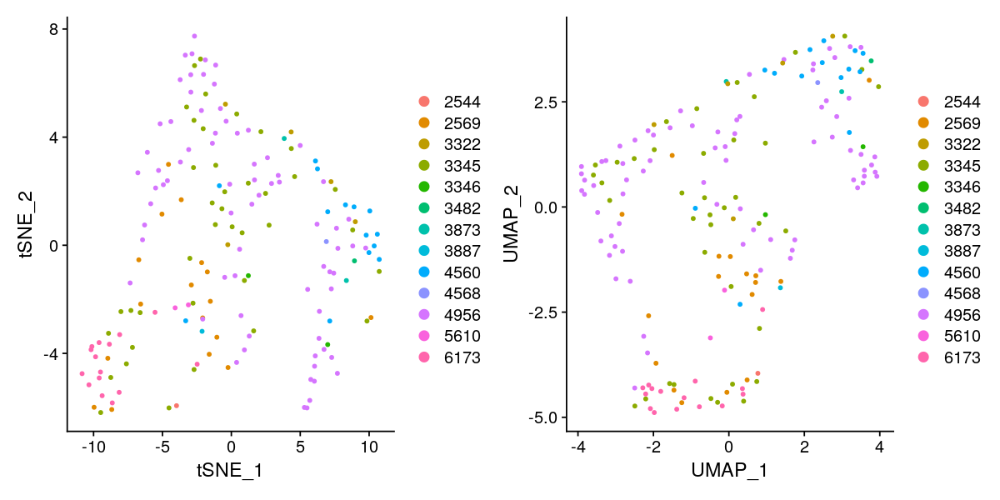

In [827]:
options(repr.plot.width=10, repr.plot.height=5)
plot1 <- DimPlot(seurat_object_DA, reduction = "tsne", group.by = "donor_id")
plot2 <- DimPlot(seurat_object_DA, reduction = "umap", group.by = "donor_id")
plot1 + plot2

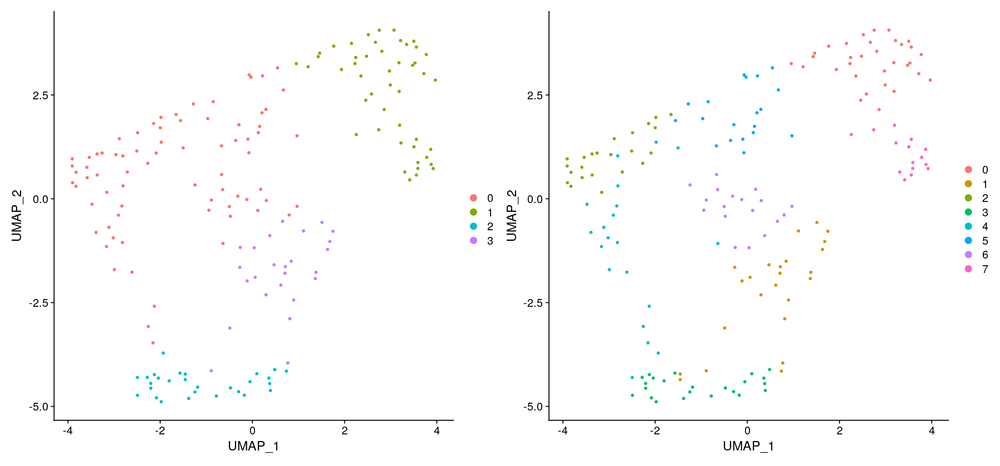

In [828]:
options(repr.plot.width=15, repr.plot.height=7)
plot1 <- DimPlot(seurat_object_DA, reduction = "umap", group.by = 'RNA_snn_res.0.5')
plot2 <- DimPlot(seurat_object_DA, reduction = "umap", group.by = 'RNA_snn_res.2')
plot1 + plot2

In [847]:
Idents(seurat_object_DA) <- 'RNA_snn_res.2'
table(Idents(seurat_object_DA))


 0  1  2  3  4  5  6  7 
31 24 23 23 20 19 18 16 

In [848]:
cntByPatient = table(Idents(seurat_object_DA), seurat_object_DA$donor_id)
cntByPatient = t(round(cntByPatient/rowSums(cntByPatient), 2))
cbind(sort(apply(cntByPatient, 2, max)))

1,0.29
0,0.35
6,0.44
3,0.57
5,0.58
2,0.65
4,0.70
7,0.88


### Differentially expressed genes / Markers

In [849]:
DEGs_DA <- FindAllMarkers(seurat_object_DA, only.pos=TRUE, min.pct=0.25)

# Save the markers for later
saveRDS(DEGs_DA, file = "DEGs_DA.rds")

# To save as text:
write.table(DEGs_DA, file = "DEGs_DA.txt", sep = "\t", quote = F, col.names = F)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



##### Top markers for each cluster:

In [852]:
DEGs_DA_top5 <- DEGs_DA %>% group_by(cluster) %>% top_n(5, avg_logFC)
DEGs_DA_top5

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
2.345065e-16,1.2356715,0.871,0.210,6.164002e-12,0,NTNG1
3.752914e-15,1.6125795,1.000,0.776,9.864534e-11,0,RBFOX1
9.249741e-14,0.9355813,1.000,0.811,2.431294e-09,0,PBX3
4.034392e-13,0.9412801,1.000,1.000,1.060440e-08,0,GPC6
1.190022e-11,1.3367510,0.903,0.545,3.127973e-07,0,SHISA6
1.131763e-07,0.8906656,0.958,0.753,2.974839e-03,1,EBF1
1.920979e-07,0.6274768,0.708,0.220,5.049292e-03,1,PDE1C
2.828203e-05,0.6637407,0.750,0.380,7.433932e-01,1,TCF4
8.241003e-05,0.7635186,0.958,0.600,1.000000e+00,1,CDH13


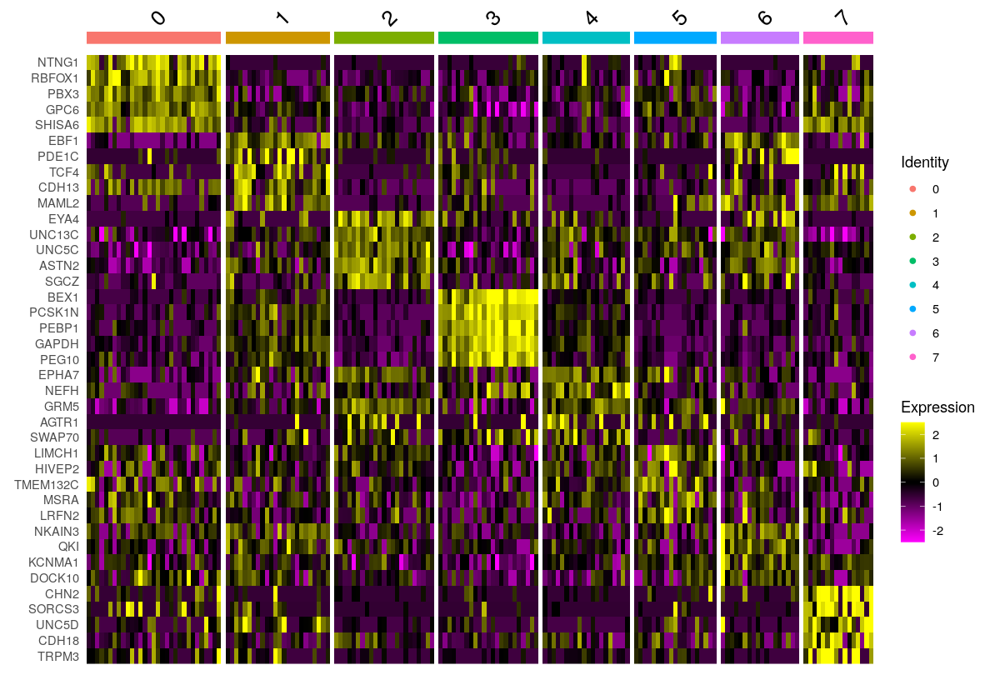

In [854]:
options(repr.plot.width=10, repr.plot.height=7)
DoHeatmap(seurat_object_DA, features = DEGs_DA_top5$gene)

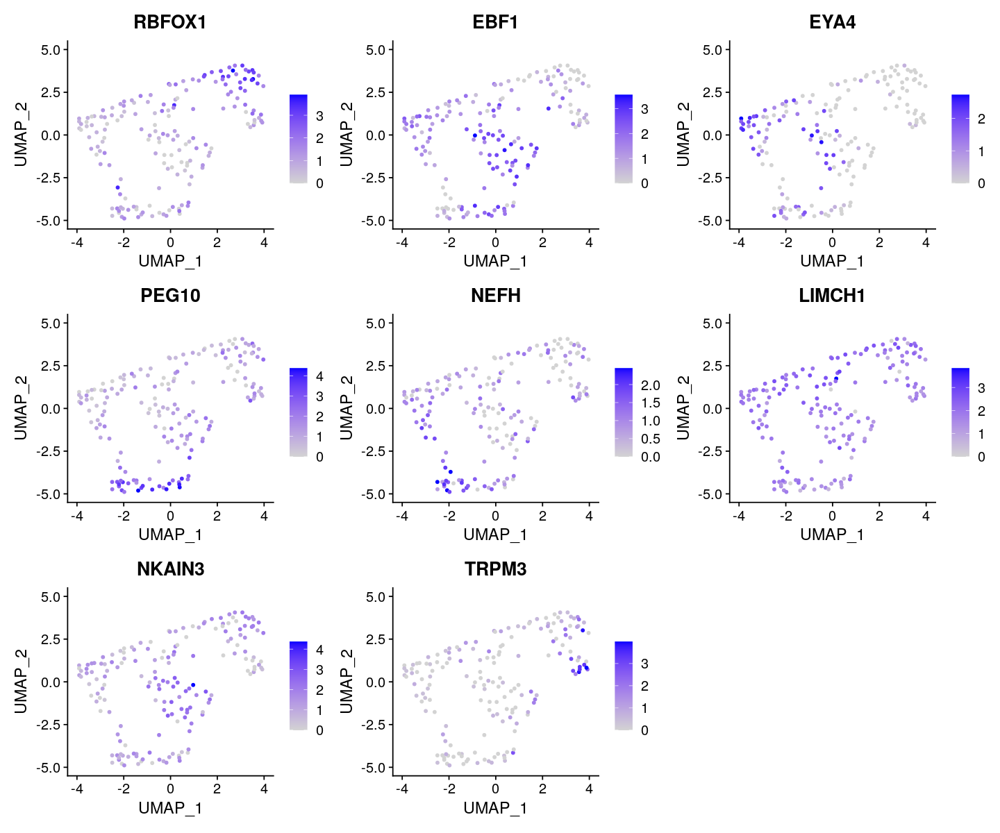

In [855]:
options(repr.plot.width=12, repr.plot.height=10)
top1 <- DEGs_DA %>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
FeaturePlot(seurat_object_DA, features = top1$gene)

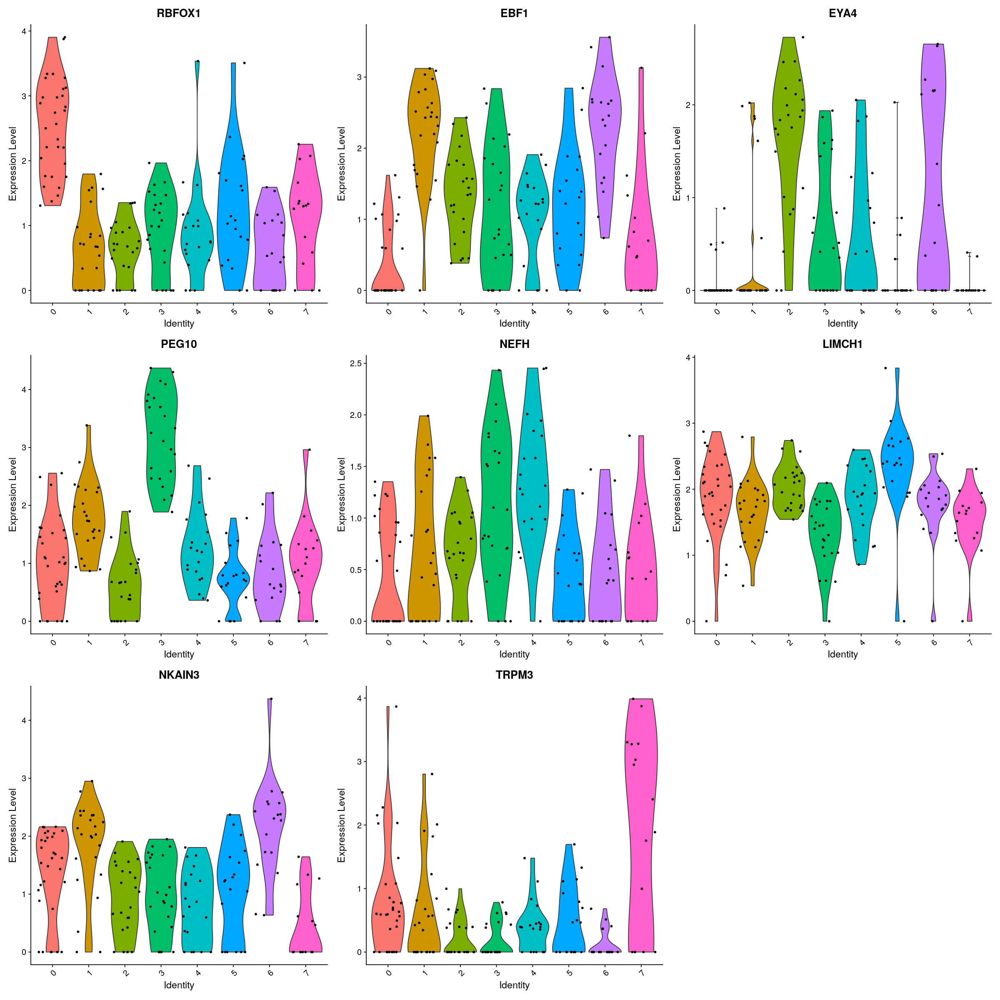

In [856]:
options(repr.plot.width=20, repr.plot.height=20)
top1 <- DEGs_DA %>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
VlnPlot(seurat_object_DA, features = top1$gene)

In [871]:
# Identify gene markers
all_markers <-FindAllMarkers(seurat_object_DA, 
                             min.pct =  0.25, 
                             min.diff.pct = 0.25)

# Return top 10 markers for cluster specified 'x'
gen_marker_table <- function(x){
  all_markers[all_markers$cluster == x, ] %>%
  head(n=10)
}

# Create a data frame of results for clusters 0-6
top10_markers <- map_dfr(0:6, gen_marker_table)

View(top10_markers)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



ERROR: Error in map_dfr(0:6, gen_marker_table): could not find function "map_dfr"


In [875]:
all_markers

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
NTNG1,2.345065e-16,1.2356715,0.871,0.210,6.164002e-12,0,NTNG1
SLC24A4,1.447439e-15,0.6813206,0.581,0.042,3.804594e-11,0,SLC24A4
CDH20,1.017776e-14,0.8311257,0.710,0.112,2.675224e-10,0,CDH20
ALCAM,8.674357e-12,-1.0782274,0.581,0.951,2.280055e-07,0,ALCAM
SHISA6,1.190022e-11,1.3367510,0.903,0.545,3.127973e-07,0,SHISA6
LMX1A,3.654856e-11,0.8317792,0.839,0.287,9.606788e-07,0,LMX1A
ALDH1A1,1.708835e-10,-1.5141464,0.258,0.804,4.491672e-06,0,ALDH1A1
LINC00937,1.362334e-09,0.5979625,0.806,0.273,3.580895e-05,0,LINC00937
LMO3,1.363249e-09,-1.0819386,0.387,0.797,3.583301e-05,0,LMO3
